In [1]:
import numpy             as np
import matplotlib.pyplot as plt

# CBF
from data      import make_rectangle, insert_shape, plot_data, get_gparams
from agent     import Agent
from optim     import clarabel_solve_cbf, get_h
from utils     import plot_cbf, quad_plot, union, intersection, difference
from controls  import hjb_controls, hjb_controls_parallel

# HJB
from   IPython.display      import HTML
import jax
import jax.numpy            as jnp
import matplotlib.animation as anim
import matplotlib.pyplot    as plt
import plotly.graph_objects as go
import hj_reachability      as hj

%load_ext autoreload
%autoreload 2

spacing: 0.065


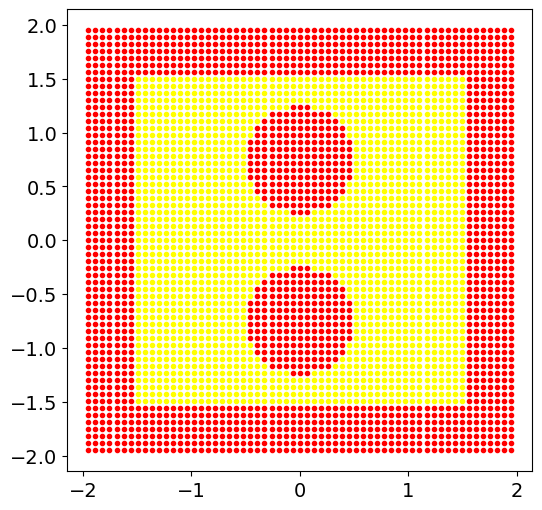

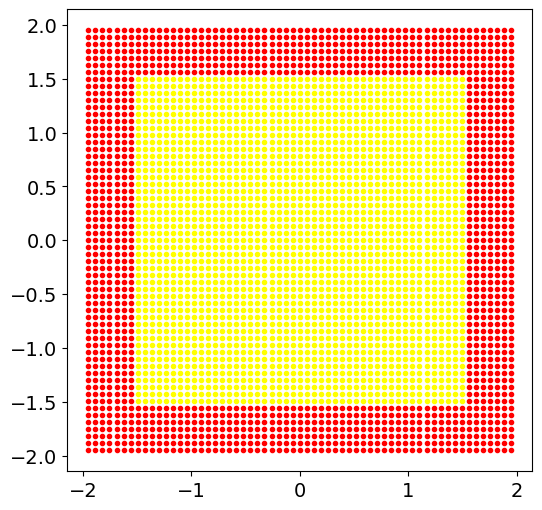

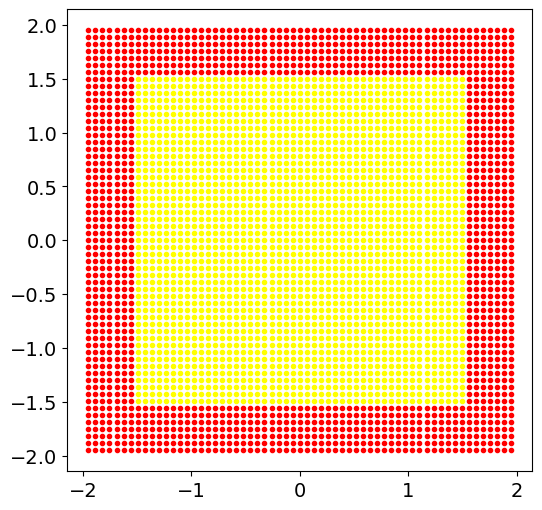

In [2]:
#########################
### Data Construction ###
#########################

# grid parameters
width         = 3
density       = 250
unsafe_margin = 0.3

# make grid and two circular obstacles, collect obstacle points
obs_funcs = []
grid, params, obs_dict, is_obs_grid = make_rectangle(height=width, width=width, density=density, unsafe_margin=unsafe_margin, center=(0,0), return_params=True)
obs_dict, is_obs_circ1  = insert_shape(np.array([0,  0.75]), grid, obs_dict, shape='circle', scale=0.5, theta=0)
obs_dict, is_obs_circ2  = insert_shape(np.array([0, -0.75]), grid, obs_dict, shape='circle', scale=0.5, theta=0)
obstacles = np.array([pt for pt in grid if obs_dict[tuple(np.round(pt, 3))] != 0])
obs_funcs.append(is_obs_grid)
obs_funcs.append(is_obs_circ1)
obs_funcs.append(is_obs_circ2)

# auxiliary grids 
c_grid, c_obs_dict = make_rectangle(height=width, width=width, density=density/1, unsafe_margin=unsafe_margin, center=(0,0))
s_grid, s_obs_dict = make_rectangle(height=width, width=width, density=density/1, unsafe_margin=unsafe_margin, center=(0,0)) # density of s_grid\
# should equal main grid density for set difference to work correctly


# HJB grid
lo, hi, n, spacing = params
print("spacing:", spacing)
hjb_grid = hj.Grid.from_lattice_parameters_and_boundary_conditions(hj.sets.Box(lo, hi), n)

plot_data(  grid,   obs_dict, size=6)
plot_data(c_grid, c_obs_dict, size=6)
plot_data(s_grid, s_obs_dict, size=6)

(3721, 2)


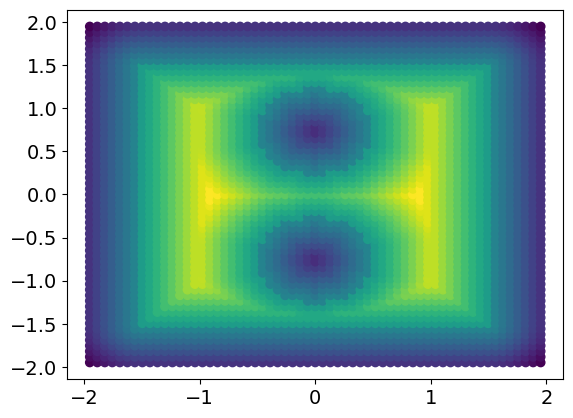

In [3]:
#####################################
### Make Signed Distance Function ###
#####################################

l = np.empty(hjb_grid.states.shape[:-1])

obs_coords = np.array([x for x in grid if obs_dict[tuple(np.round(x, 3))] != 0])
fre_coords = np.array([x for x in grid if obs_dict[tuple(np.round(x, 3))] == 0])

for i in range(n[0]):
    for j in range(n[1]):
        if obs_dict[tuple(np.round(np.array(hjb_grid.states[i, j]), 3))] != 0:
            l[i, j] = -np.min(np.linalg.norm(fre_coords - hjb_grid.states[i, j], axis=1))
        else:
            l[i, j] =  np.min(np.linalg.norm(obs_coords - hjb_grid.states[i, j], axis=1))

print(grid.shape)
plt.scatter(grid[:,0], grid[:,1], c=l.reshape(-1, 1))
plt.show()

In [4]:
#############################
### Configure HJB Solver ###
#############################
gamma  = 0.33
cbvf   = True
umax   = 1
utype  ="box"
values = jnp.array(l)
solver_settings = hj.SolverSettings.with_accuracy("very_high",
                                                  hamiltonian_postprocessor=hj.solver.backwards_reachable_tube,
                                                  value_postprocessor      =hj.solver.static_obstacle(l))

In [5]:
###################################
### Solve PDE for final surface ###
###################################

dynamics      = hj.systems.Planar(gamma=gamma, control_type=utype, umax=umax)
time          = 0.
target_time   =-10
target_values = hj.step(solver_settings, dynamics, hjb_grid, time, values, target_time)

box constraints with umax 1


100%|###############################################################################################################################################| 10.0000/10.0 [00:01<00:00,  8.93sim_s/s]


<Figure size 640x480 with 0 Axes>

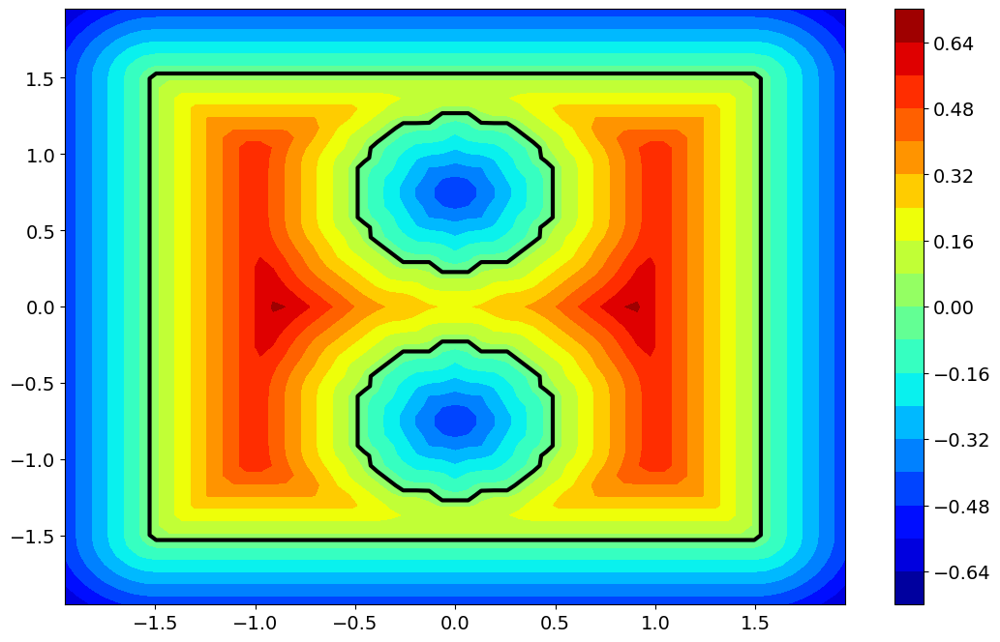

In [6]:
##########################
### Plot final surface ### 
##########################

plt.jet()
plt.figure(figsize=(13, 8))
plt.contourf(hjb_grid.coordinate_vectors[0], hjb_grid.coordinate_vectors[1], target_values[:, :].T, levels=16)
plt.colorbar()
plt.contour(hjb_grid.coordinate_vectors[0],
            hjb_grid.coordinate_vectors[1],
            target_values[:, :].T,
            levels=0,
            colors="black",
            linewidths=3)

In [7]:
##########################################
### Solve for backwards reachable tube ###
##########################################

times = np.linspace(0, -30, 58)
initial_values = jnp.array(l)
all_values = hj.solve(solver_settings, dynamics, hjb_grid, times, initial_values)

100%|###############################################################################################################################################| 30.0000/30.0 [00:03<00:00,  8.46sim_s/s]


In [8]:
#######################################################
### Visualize evolution of backwards reachable tube ###
#######################################################

vmin, vmax = all_values.min(), all_values.max()
levels = np.linspace(round(vmin), round(vmax), 15*(round(vmax) - round(vmin) + 1))
fig = plt.figure(figsize=(13, 8))

def render_frame(i, colorbar=False):
    plt.contourf(hjb_grid.coordinate_vectors[0],
                 hjb_grid.coordinate_vectors[1],
                 all_values[i, :, :].T,
                 vmin=vmin,
                 vmax=vmax,
                 levels=levels)
    if colorbar:
        plt.colorbar()
    plt.contour(hjb_grid.coordinate_vectors[0],
                hjb_grid.coordinate_vectors[1],
                target_values[:, :].T,
                levels=0,
                colors="black",
                linewidths=3)

render_frame(0, True)
animation = HTML(anim.FuncAnimation(fig, render_frame, all_values.shape[0], interval=50).to_html5_video())
plt.close(); animation

In [9]:
###########################
### Agent Configuration ###
###########################

bf    = 31    # csrbf order
b     =-0.5   # offset 
s     = 0.75  # csrbf zeroing
nm    = 0.2   # nm * n_safe = number of neighbors to consider
p     = 0.5   # num neighber percentile under which boundary
mult  = 1
utype = utype # defined w/ hjb above
umax  = umax  # defined w/ hjb above
solver        = 'CLARABEL'
sensor_radius = 1
rx            = sensor_radius + 0.2 # sample radius
rc            = sensor_radius # radius around scan in which centers are chosen
init_x        = 0
init_y        = 0

a = Agent(dynamics, np.array([init_x, init_y]), grid, obs_dict, width         = width, 
                                                                sensor_radius = sensor_radius, 
                                                                bf            = bf, 
                                                                b             = b, 
                                                                s             = s,
                                                                umax          = umax,
                                                                utype         = utype,
                                                                solver        = solver,
                                                                spacing       = spacing,
                                                                obstacles     = obstacles)

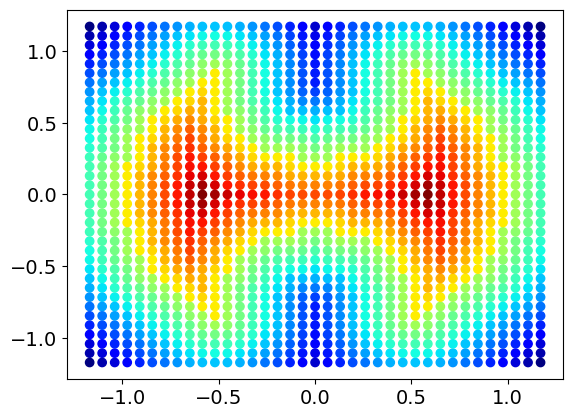

100%|#############################################################################################################################################| 100.0000/100.0 [00:02<00:00, 36.61sim_s/s]


<Figure size 640x480 with 0 Axes>

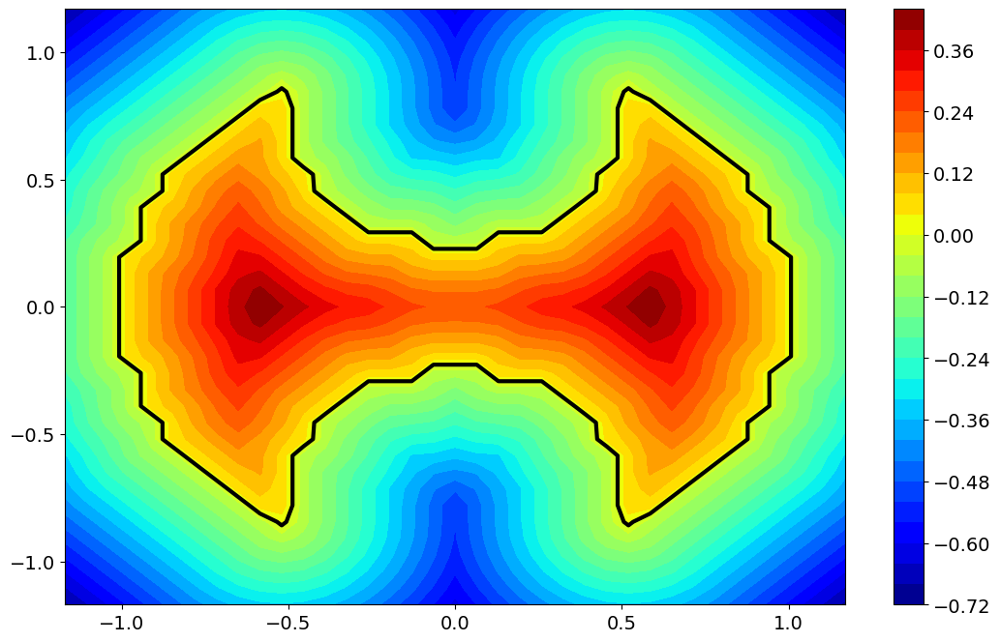

In [10]:
############################
### Scan for initial CBF ###
############################

# scan states 
pts_safe, pts_unsafe,\
             in_scan_f = a.scan(ret_in_scan_f=True) 
scan_funcs = [in_scan_f]
samples, gparams,\
         is_obs_sample = a.sample(rx, grid=s_grid, hjb_grid=hjb_grid, hjb=True)
sample_funcs = [is_obs_sample]
loc_V, loc_hjb_grid    = a.get_local_V(gparams, obs_funcs + [is_obs_sample], rx=rx, T=100, mult=mult)

scan_safe, scan_unsafe = a.scan_hjb(loc_V, loc_hjb_grid)
n_safe                 = len(pts_safe)
x_buffer, x_safe       = a.make_buffer(scan_safe, int(nm * n_safe), p)

# unsafe states 
if scan_unsafe.shape[0] != 0:
    x_unsafe = np.vstack((scan_unsafe, samples))
else: 
    x_unsafe = samples    

In [11]:
#######################
### Collect centers ###
#######################

C = []
for x in c_grid:
    if np.linalg.norm(x[:2] - a.pos[:2]) <= rc:
        C.append(x)
C = np.array(C)
a.centers.append(C)

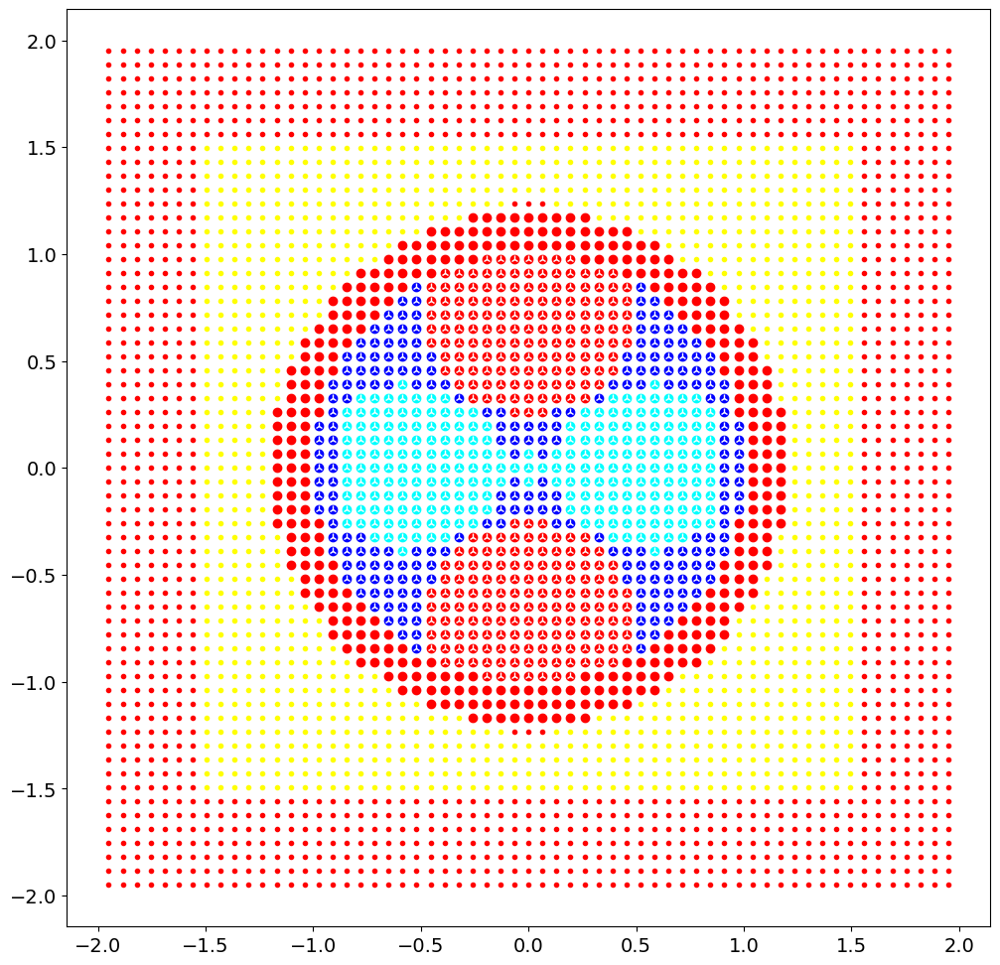

In [12]:
##############################
### Plot  Initial CBF Data ###
##############################

plot_data(grid, obs_dict, [(x_safe  , "cyan"  , 'o'), 
                           (x_buffer, "blue"  , 'o'), 
                           (x_unsafe, "red"   , 'o'),
                           (C       , "white" , '2')])

In [13]:
###########################################
### Obtain controls from Value Function ###
###########################################

from tqdm import tqdm

u_safe = hjb_controls_parallel(a, x_safe, loc_hjb_grid, loc_V, verbose=True)
if x_buffer.shape[0] != 0:
    u_buffer = hjb_controls_parallel(a, x_buffer, loc_hjb_grid, loc_V)
else:
    u_buffer = np.array([])

                                     CVXPY                                     
                                     v1.4.2                                    
(CVXPY) Jul 24 03:01:20 PM: Your problem has 470 variables, 1 constraints, and 0 parameters.
(CVXPY) Jul 24 03:01:20 PM: It is compliant with the following grammars: DCP, DQCP
(CVXPY) Jul 24 03:01:20 PM: (If you need to solve this problem multiple times, but with different data, consider using parameters.)
(CVXPY) Jul 24 03:01:20 PM: CVXPY will first compile your problem; then, it will invoke a numerical solver to obtain a solution.
(CVXPY) Jul 24 03:01:20 PM: Your problem is compiled with the CPP canonicalization backend.
-------------------------------------------------------------------------------
                                  Compilation                                  
-------------------------------------------------------------------------------
(CVXPY) Jul 24 03:01:20 PM: Compiling problem (target solver=CLARABEL).

In [14]:
##############################
### Initial CBF Parameters ###
##############################
    
gamma_safe   = 0.3
gamma_unsafe =-0.3
gamma_dyn    = 0.01
lam_safe     = 1
lam_dyn      = 1
lam_unsafe   = 1
lam_dh       = 0
lam_sp       = 0

In [15]:
#########################
### Solve Initial CBF ###
#########################

# get h as a function of agent parameter
h = get_h(a)

print(u_safe.shape)
theta = np.array(clarabel_solve_cbf(a, x_safe, u_safe, x_buffer, u_buffer, x_unsafe, gamma_safe, gamma_dyn, gamma_unsafe))

a.thetas.append(theta)
a.rectify_c_and_theta()

# initialize plotting objects
init_pos       = np.copy(a.pos)
curr_centers   = np.copy(np.array(a.centers))
curr_thetas    = np.copy(np.array(a.thetas))
curr_data      = np.copy(np.vstack((x_safe, x_buffer, x_unsafe)))
curr_traj      = np.copy(a.pos.reshape(-1, 2))
quad_plot_args =[(0, curr_centers, curr_thetas, curr_data)]
data_safe   = np.vstack((x_buffer, x_safe))
data_unsafe = x_unsafe
all_C = C

(235, 2)
problem done building
-------------------------------------------------------------
           Clarabel.rs v0.6.0  -  Clever Acronym              

                   (c) Paul Goulart                          
                University of Oxford, 2022                   
-------------------------------------------------------------

problem:
  variables     = 749
  constraints   = 1320
  nnz(P)        = 749
  nnz(A)        = 341874
  cones (total) = 1
    : Nonnegative = 1,  numel = 1320

settings:
  linear algebra: direct / qdldl, precision: 64 bit
  max iter = 200, time limit = Inf,  max step = 0.990
  tol_feas = 1.0e-8, tol_gap_abs = 1.0e-8, tol_gap_rel = 1.0e-8,
  static reg : on, ϵ1 = 1.0e-8, ϵ2 = 4.9e-32
  dynamic reg: on, ϵ = 1.0e-13, δ = 2.0e-7
  iter refine: on, reltol = 1.0e-13, abstol = 1.0e-12,
               max iter = 10, stop ratio = 5.0
  equilibrate: on, min_scale = 1.0e-4, max_scale = 1.0e4
               max iter = 10

iter    pcost        dcost       gap   

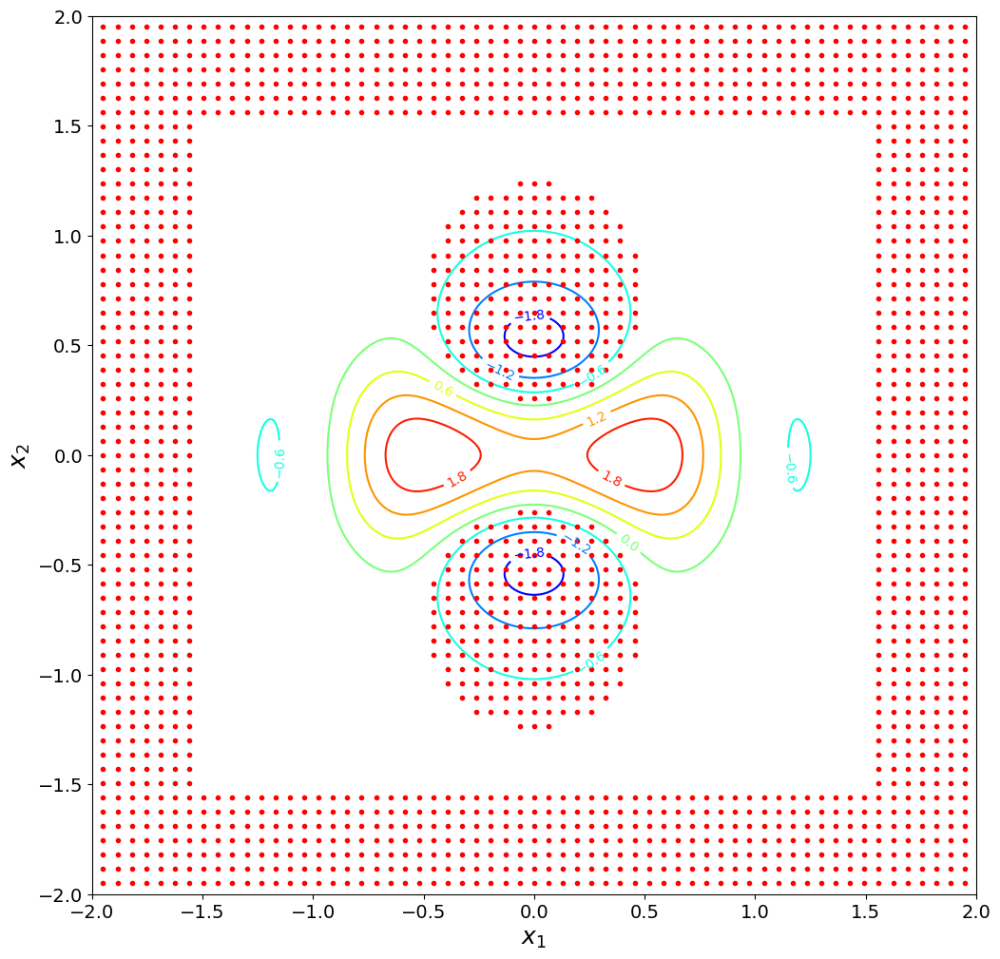

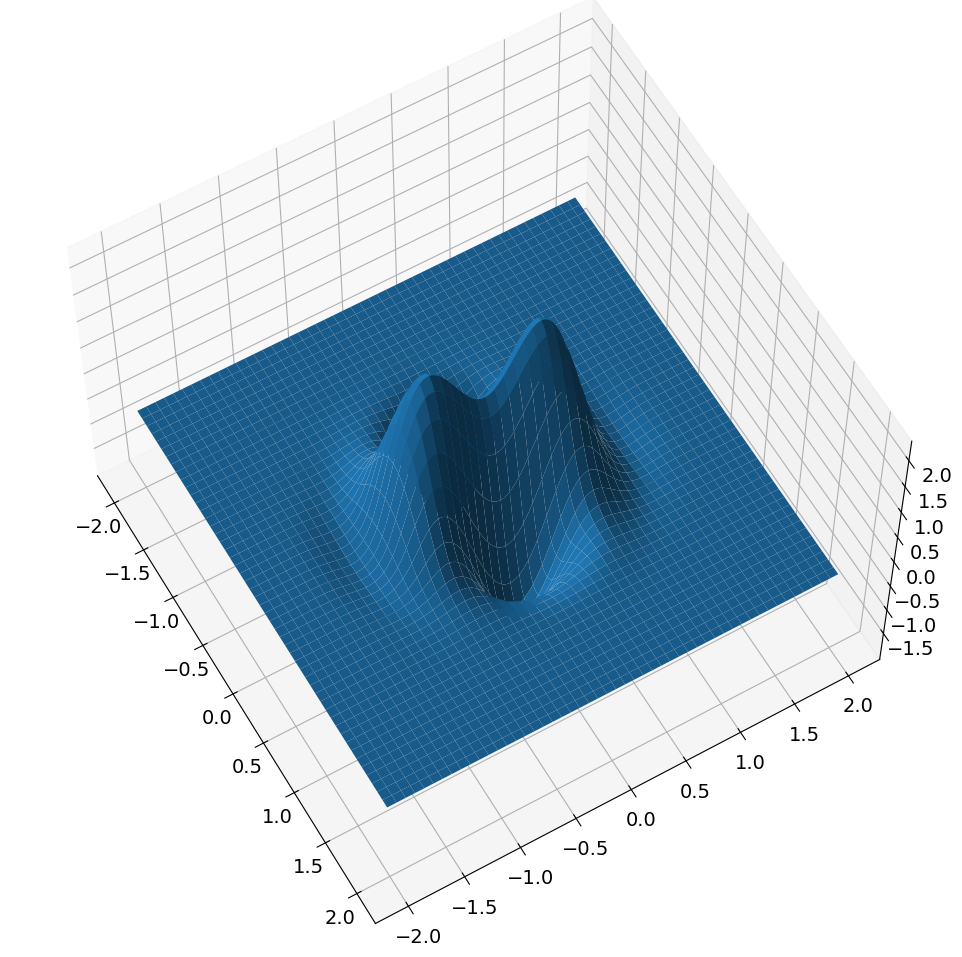

max h 2.279756011823026


In [16]:
########################
### Plot Initial CBF ###
########################

h_max = plot_cbf(a, np.array(a.centers), np.array(a.thetas), obstacles=obstacles)

#plot_cbf(a, np.array(a.centers), np.array(a.thetas), obstacles=obstacles)

In [17]:
##################################
### Configure Safe Exploration ###
##################################

DT   = 0.001   # numerical integration timestep
tol  = 0.29    # h-value at which to halt approach
eps  = 0
dx   = 0.5     # if |x'-x|<dx, approach again
tend = 20      # Duration of boundary approach
T    = 0.3     # MPC horizon (default timestep is 0.05)
N    = 3       # number of CBFs to learn

target: [1.1 0. ]
position is [0 0]
h is 1.3660513349732182
start time is 0


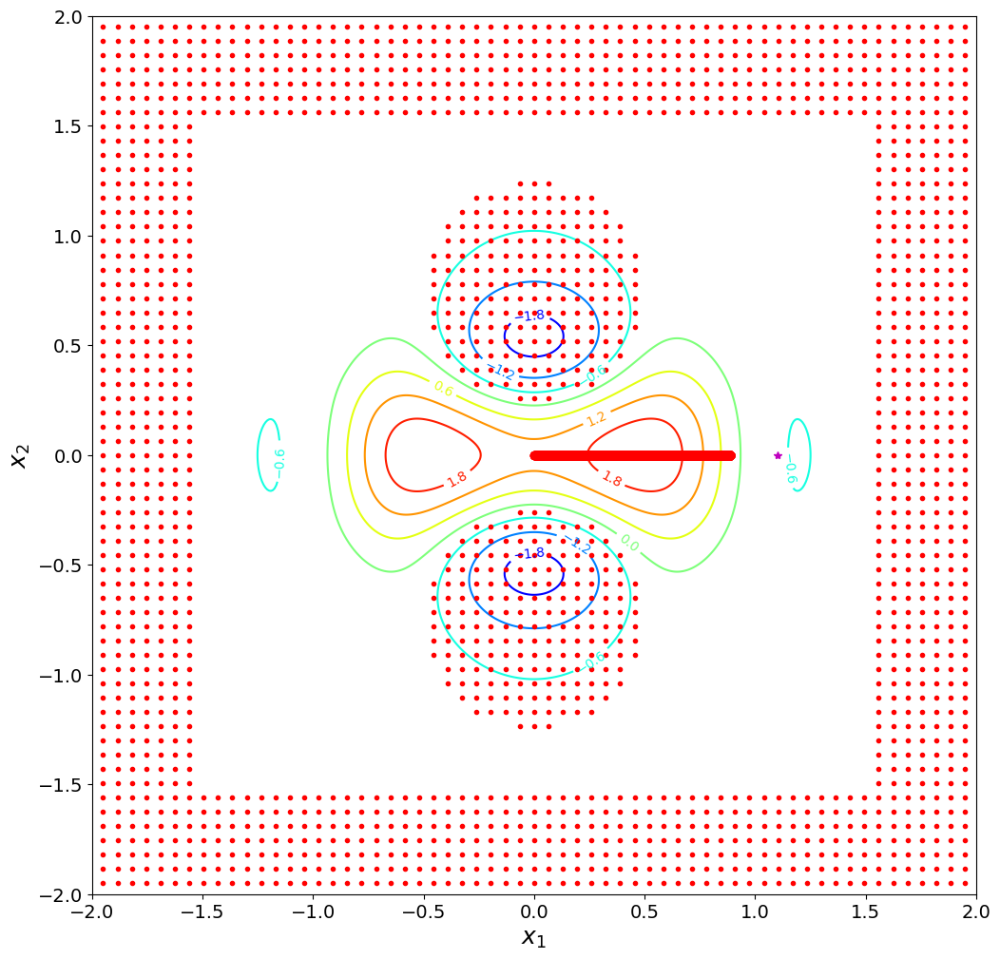

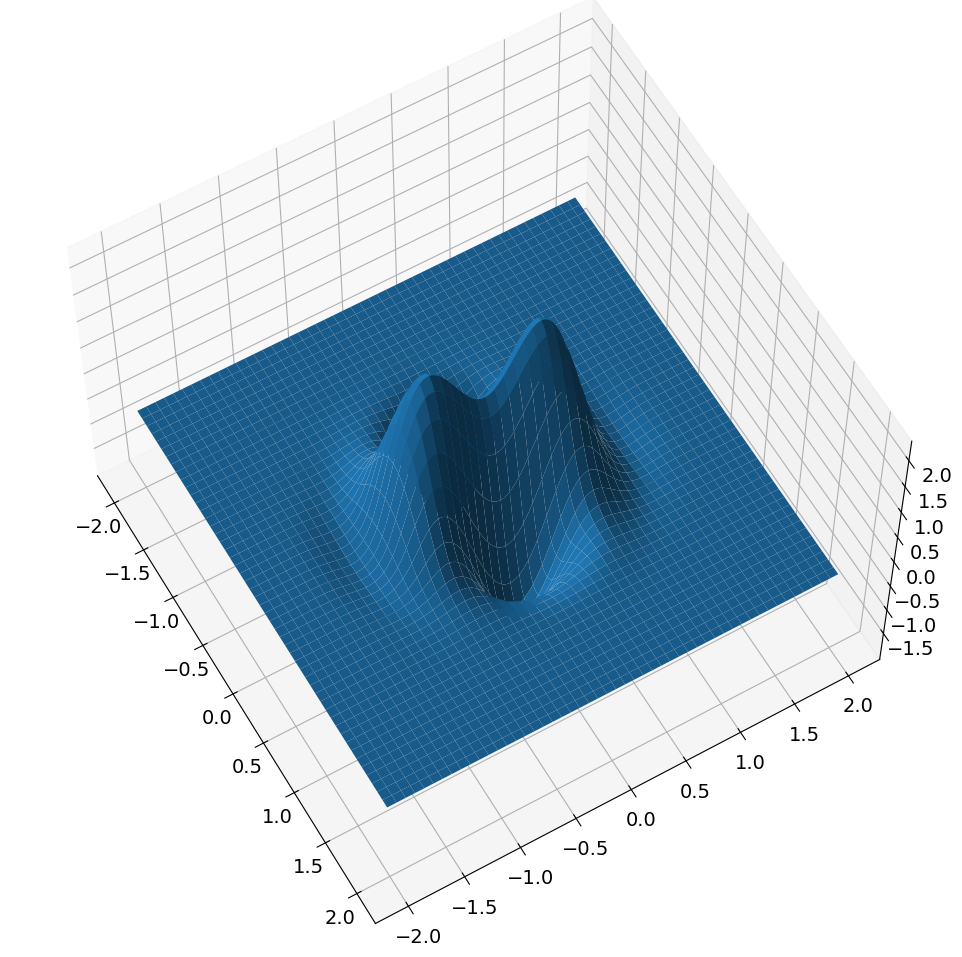

max h 2.279756011823026
new position is [8.88930917e-01 1.03252060e-11]
h is now 0.2899968435515038
new time is 20
dx: 0.8889309167861938


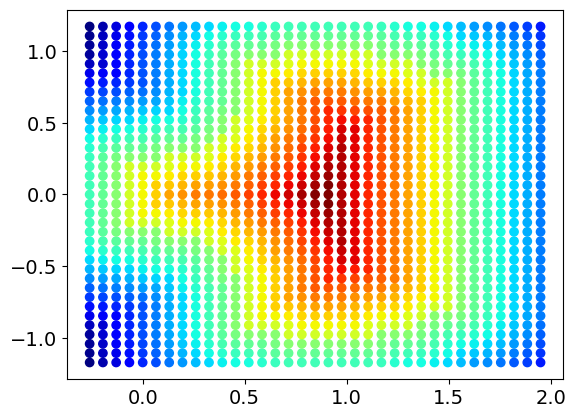

100%|#############################################################################################################################################| 100.0000/100.0 [00:03<00:00, 27.86sim_s/s]


<Figure size 640x480 with 0 Axes>

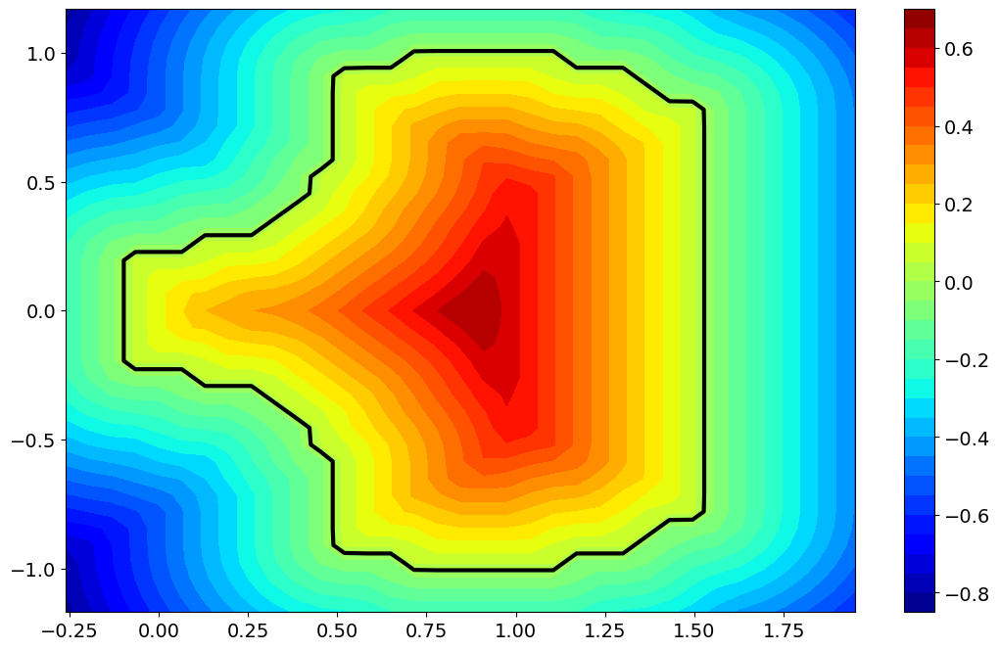

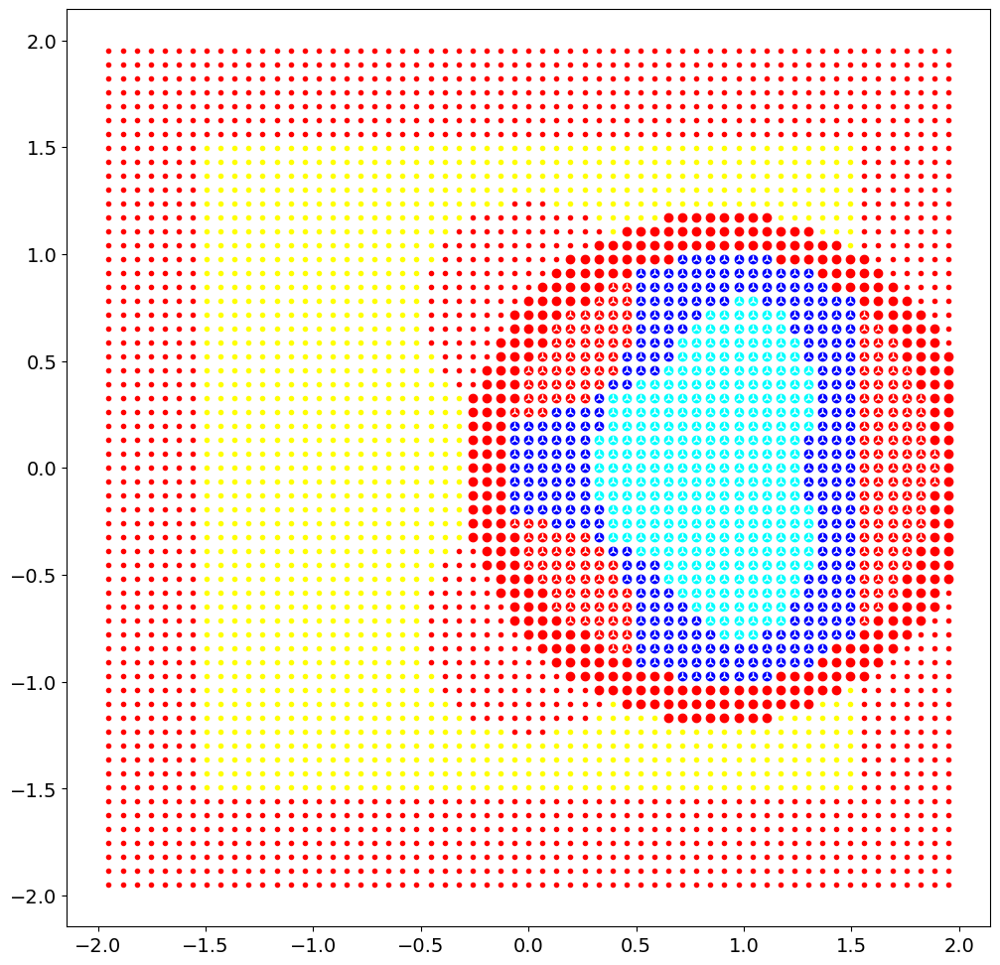

                                     CVXPY                                     
                                     v1.4.2                                    
(CVXPY) Jul 24 03:02:42 PM: Your problem has 562 variables, 1 constraints, and 0 parameters.
(CVXPY) Jul 24 03:02:42 PM: It is compliant with the following grammars: DCP, DQCP
(CVXPY) Jul 24 03:02:42 PM: (If you need to solve this problem multiple times, but with different data, consider using parameters.)
(CVXPY) Jul 24 03:02:42 PM: CVXPY will first compile your problem; then, it will invoke a numerical solver to obtain a solution.
(CVXPY) Jul 24 03:02:42 PM: Your problem is compiled with the CPP canonicalization backend.
-------------------------------------------------------------------------------
                                  Compilation                                  
-------------------------------------------------------------------------------
(CVXPY) Jul 24 03:02:42 PM: Compiling problem (target solver=CLARABEL).

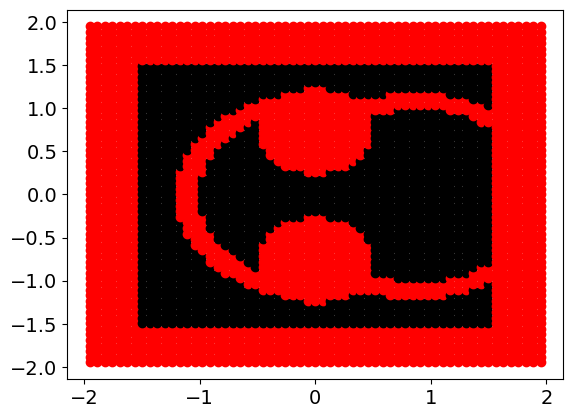

problem done building
centers shape before:
(749, 2)
(747, 2)
numc 747
cmax before 749
numc <= self.cmax
Cnew shape before (747, 2)
Cnew shape after (747, 2)
theta shape before (747,)
theta_shape after (749,)
cmax after 749
centers shape after
(749, 2)
(749, 2)
-------------------------------------------------------------
           Clarabel.rs v0.6.0  -  Clever Acronym              

                   (c) Paul Goulart                          
                University of Oxford, 2022                   
-------------------------------------------------------------

problem:
  variables     = 747
  constraints   = 1334
  nnz(P)        = 747
  nnz(A)        = 362976
  cones (total) = 1
    : Nonnegative = 1,  numel = 1334

settings:
  linear algebra: direct / qdldl, precision: 64 bit
  max iter = 200, time limit = Inf,  max step = 0.990
  tol_feas = 1.0e-8, tol_gap_abs = 1.0e-8, tol_gap_rel = 1.0e-8,
  static reg : on, ϵ1 = 1.0e-8, ϵ2 = 4.9e-32
  dynamic reg: on, ϵ = 1.0e-13, δ = 2.0e

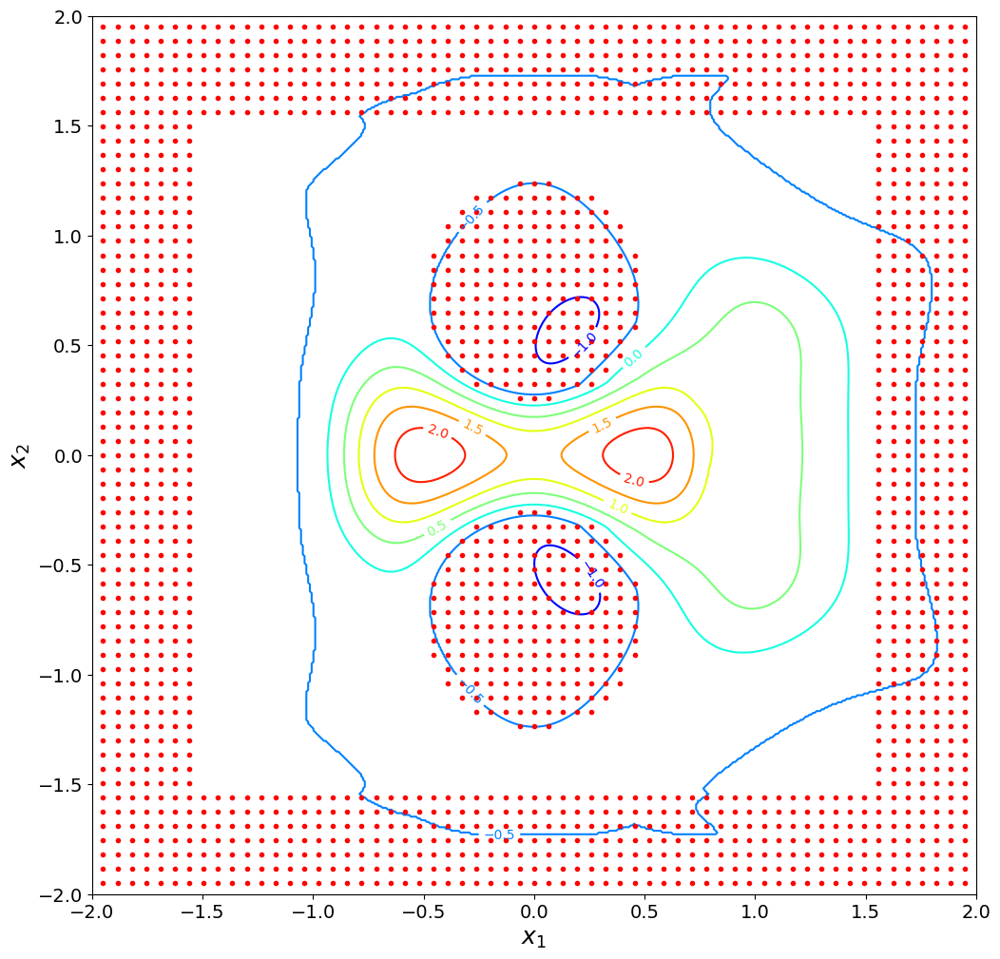

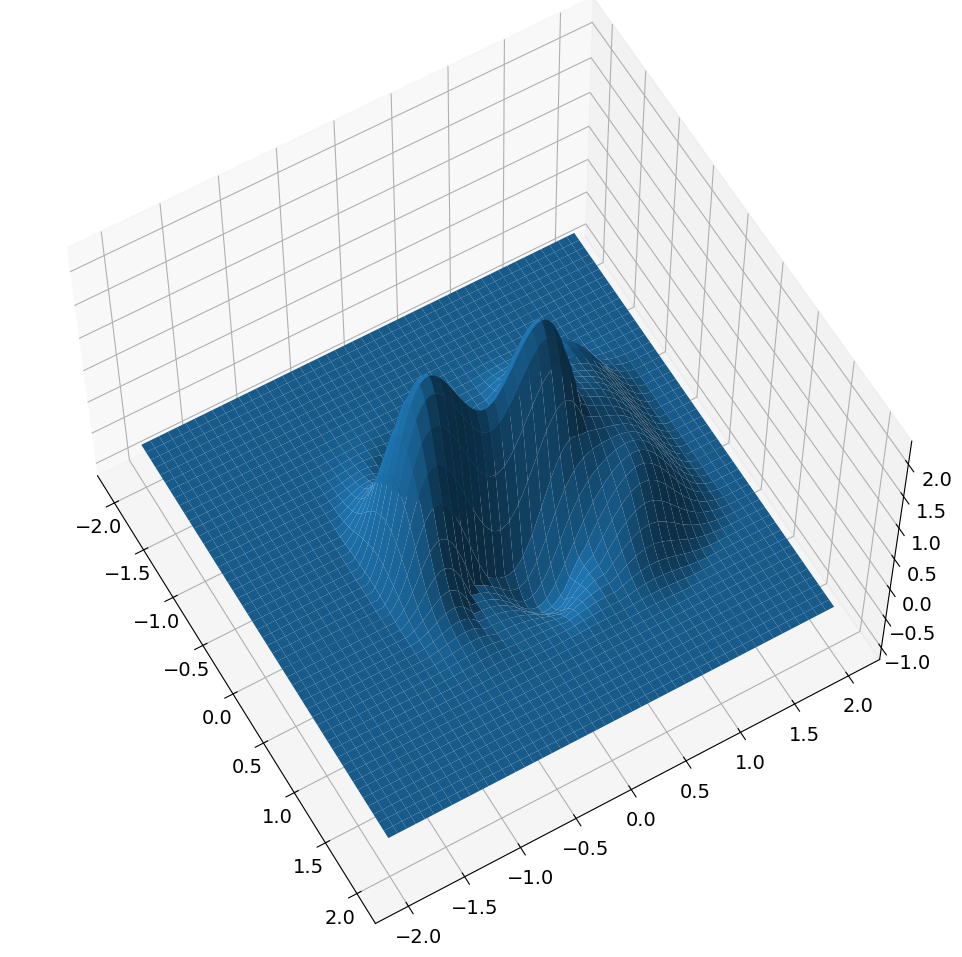

max h 2.279756011823026


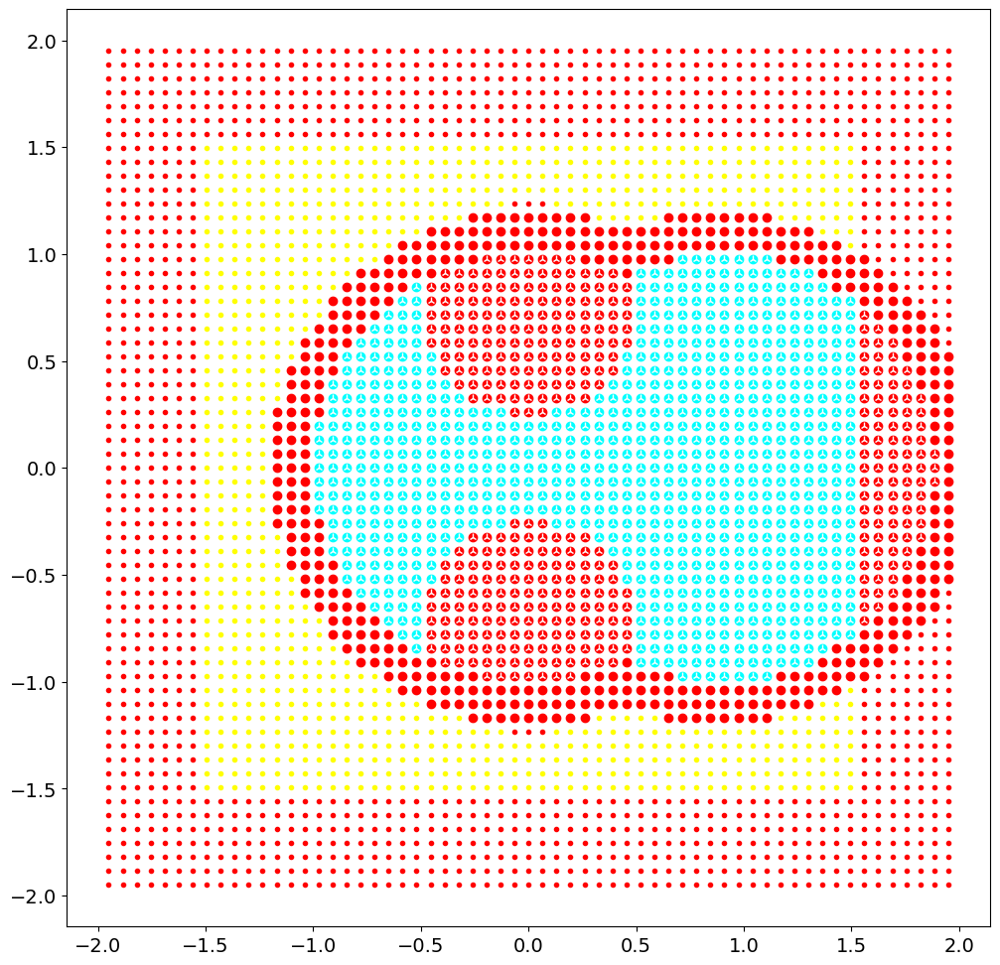

target: [1.1 1. ]
position is [8.88930917e-01 1.03252060e-11]
h is 0.9090503862196941
start time is 20


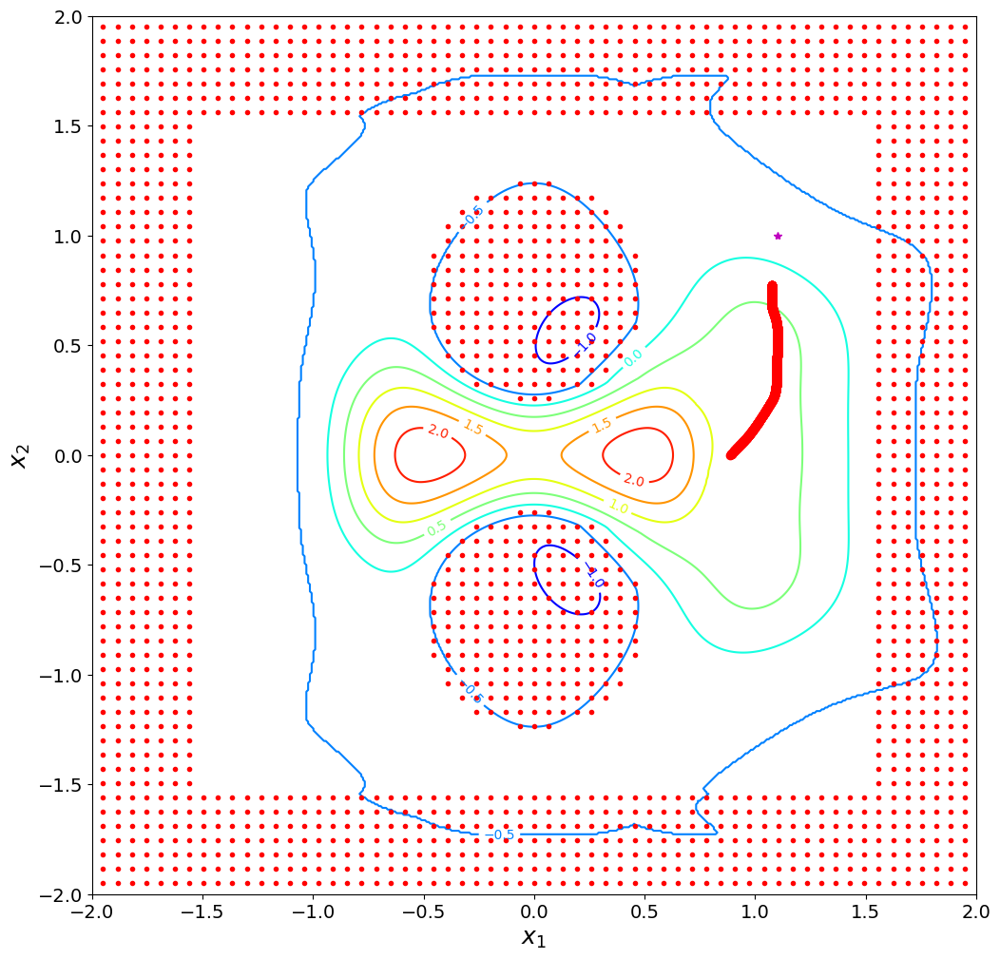

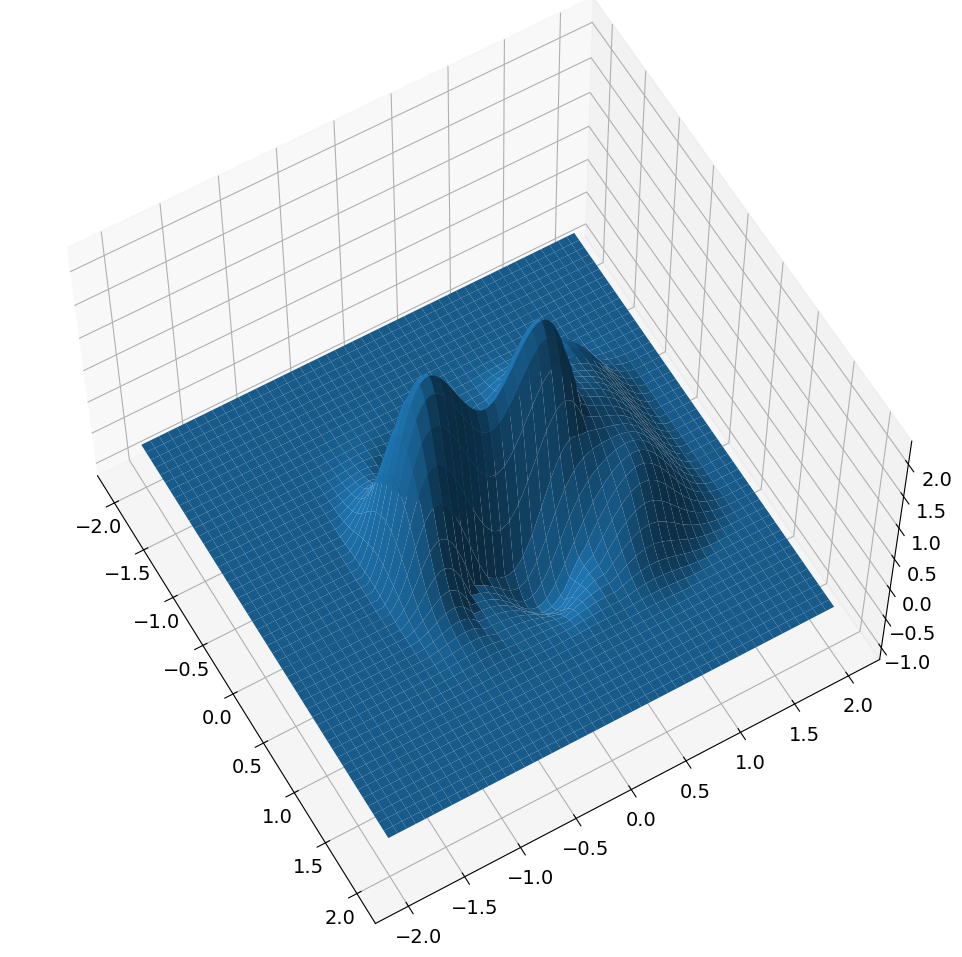

max h 2.279756011823026
new position is [1.07585692 0.77283365]
h is now 0.28993614989705896
new time is 40
dx: 0.7951183405969233


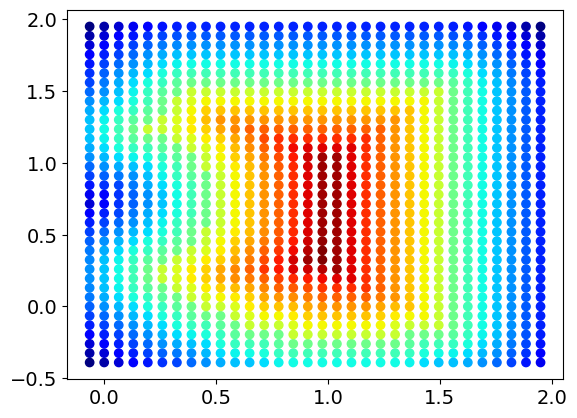

100%|#############################################################################################################################################| 100.0000/100.0 [00:04<00:00, 21.76sim_s/s]


<Figure size 640x480 with 0 Axes>

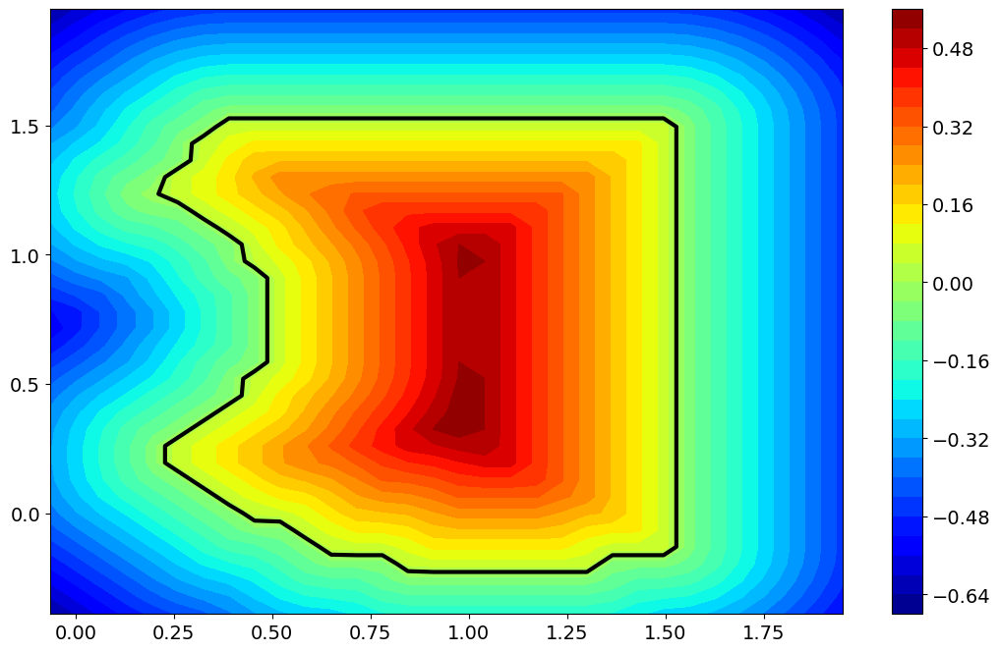

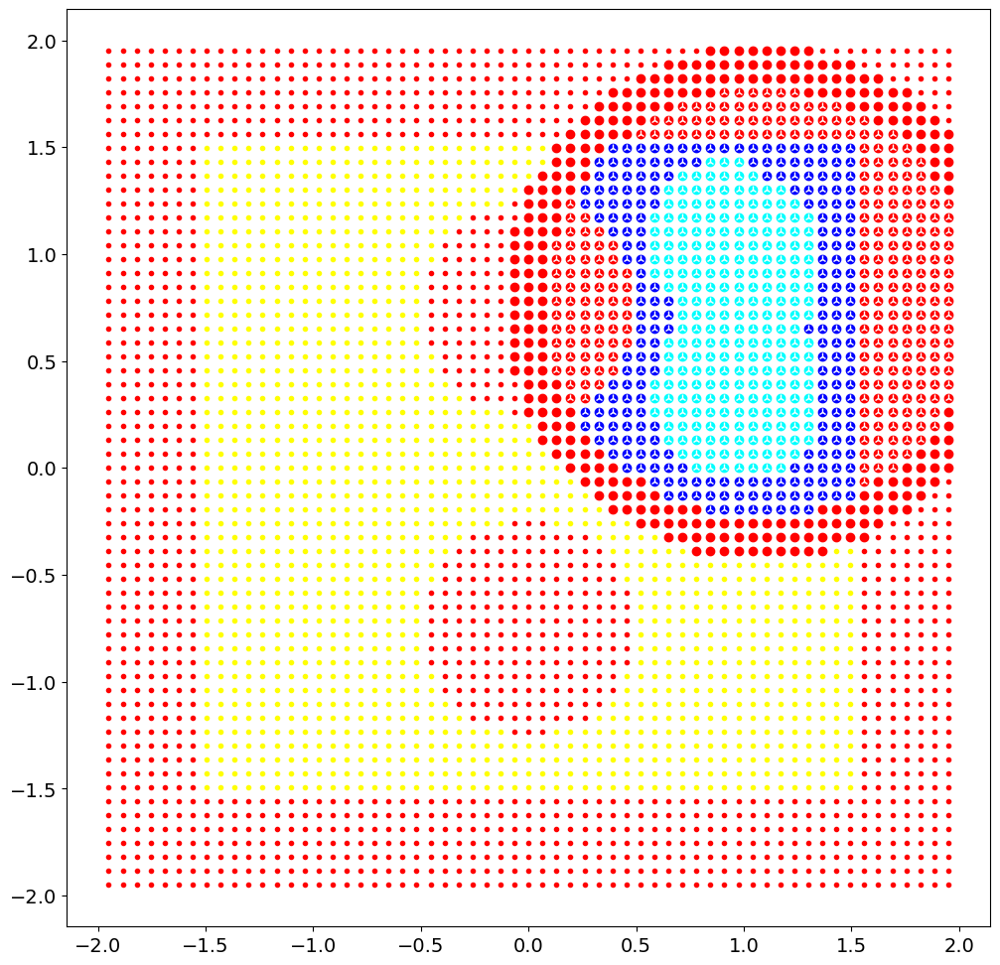

                                     CVXPY                                     
                                     v1.4.2                                    
(CVXPY) Jul 24 03:04:03 PM: Your problem has 470 variables, 1 constraints, and 0 parameters.
(CVXPY) Jul 24 03:04:03 PM: It is compliant with the following grammars: DCP, DQCP
(CVXPY) Jul 24 03:04:03 PM: (If you need to solve this problem multiple times, but with different data, consider using parameters.)
(CVXPY) Jul 24 03:04:03 PM: CVXPY will first compile your problem; then, it will invoke a numerical solver to obtain a solution.
(CVXPY) Jul 24 03:04:03 PM: Your problem is compiled with the CPP canonicalization backend.
-------------------------------------------------------------------------------
                                  Compilation                                  
-------------------------------------------------------------------------------
(CVXPY) Jul 24 03:04:03 PM: Compiling problem (target solver=CLARABEL).

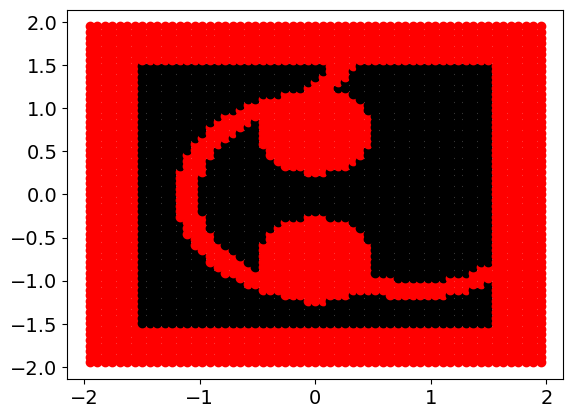

problem done building
-------------------------------------------------------------
           Clarabel.rs v0.6.0  -  Clever Acronym              

                   (c) Paul Goulart                          
                University of Oxford, 2022                   
-------------------------------------------------------------

problem:
  variables     = 735
  constraints   = 1233
  nnz(P)        = 735
  nnz(A)        = 334601
  cones (total) = 1
    : Nonnegative = 1,  numel = 1233

settings:
  linear algebra: direct / qdldl, precision: 64 bit
  max iter = 200, time limit = Inf,  max step = 0.990
  tol_feas = 1.0e-8, tol_gap_abs = 1.0e-8, tol_gap_rel = 1.0e-8,
  static reg : on, ϵ1 = 1.0e-8, ϵ2 = 4.9e-32
  dynamic reg: on, ϵ = 1.0e-13, δ = 2.0e-7
centers shape before:
(749, 2)
(749, 2)
(735, 2)
numc 735
cmax before 749
numc <= self.cmax
Cnew shape before (735, 2)
Cnew shape after (735, 2)
theta shape before (735,)
theta_shape after (749,)
cmax after 749
centers shape after
(749, 

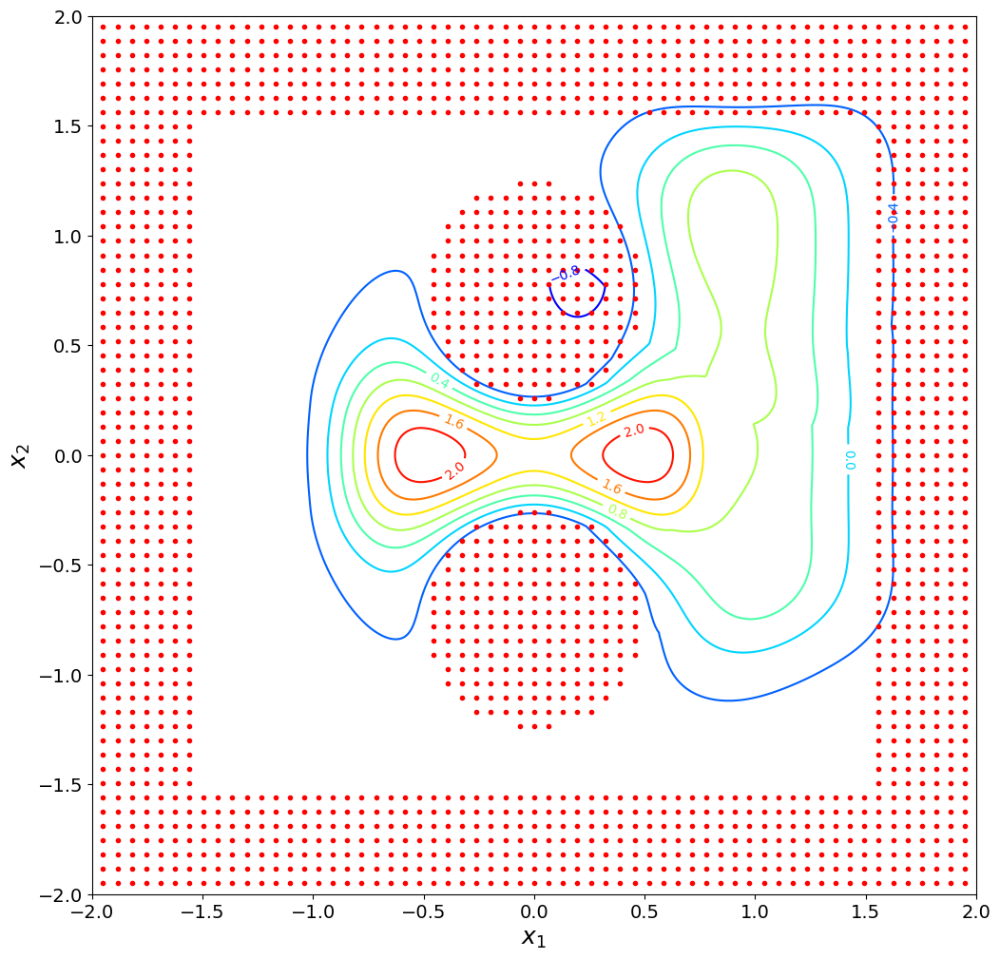

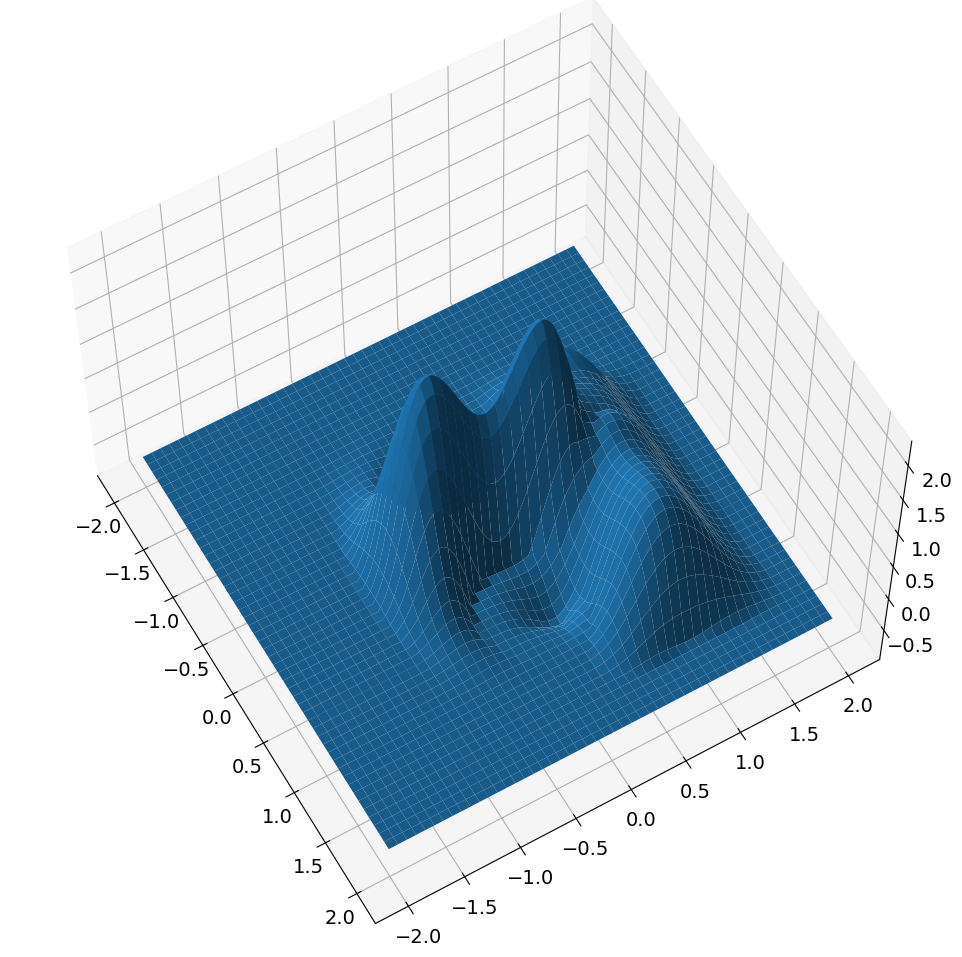

max h 2.279756011823026


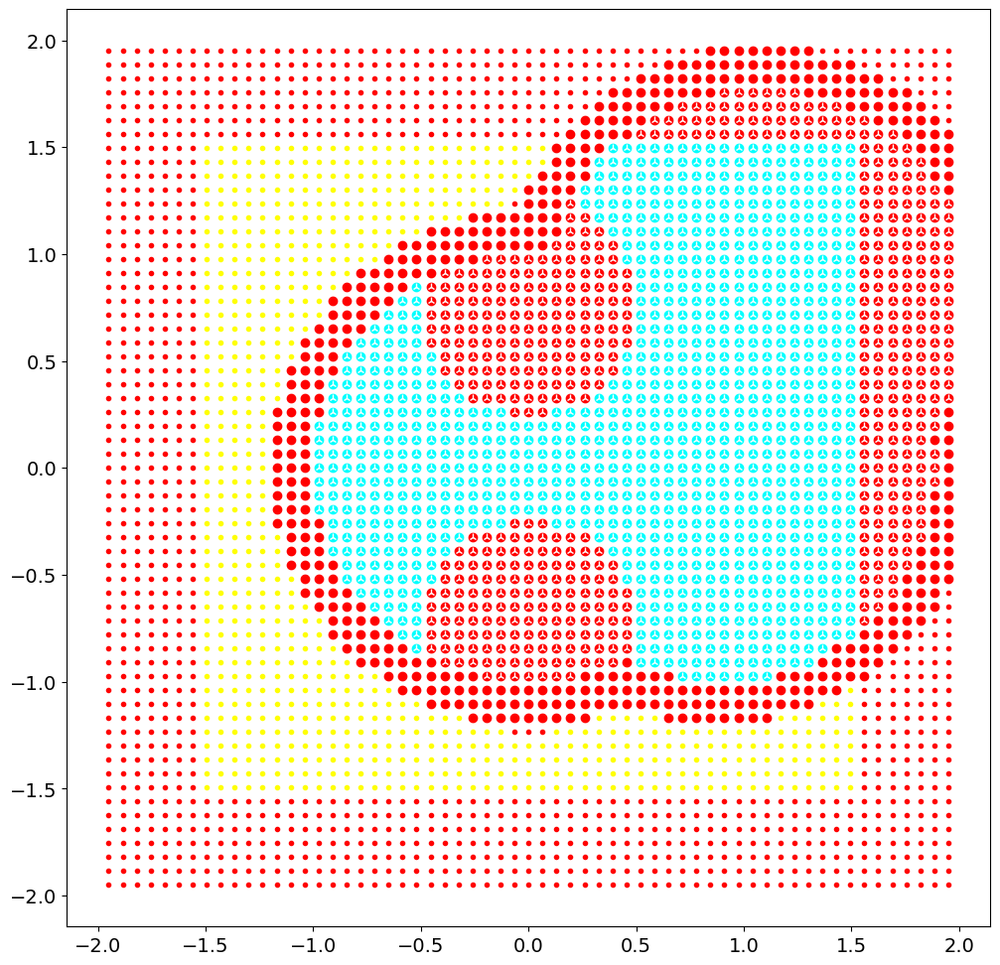

target: [ 1.1 -1. ]
position is [1.07585692 0.77283365]
h is 0.8085594244755394
start time is 40


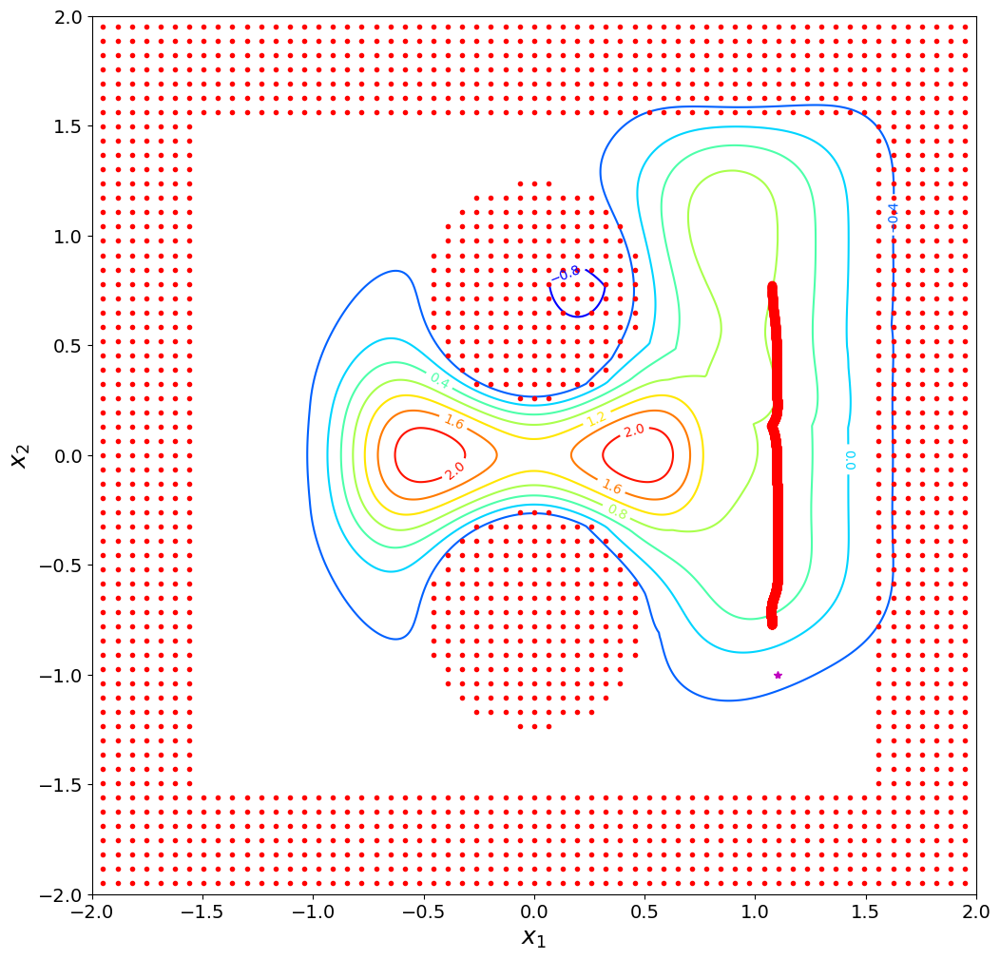

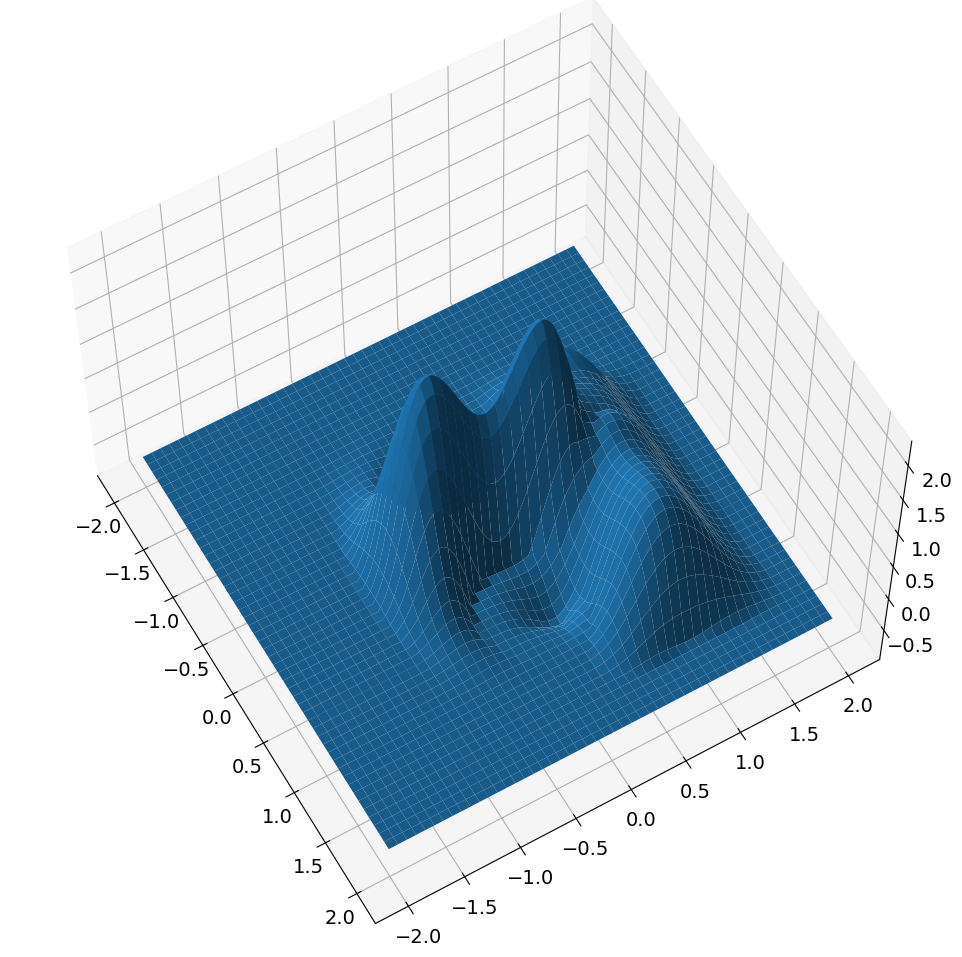

max h 2.279756011823026
new position is [ 1.07530534 -0.77242142]
h is now 0.2899978944849637
new time is 60
dx: 1.5452551634082403


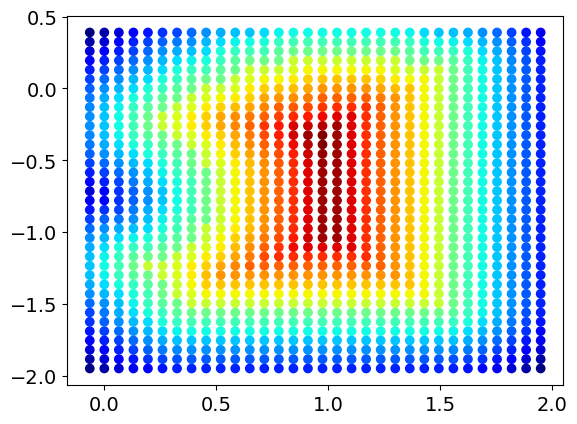

100%|#############################################################################################################################################| 100.0000/100.0 [00:04<00:00, 22.20sim_s/s]


<Figure size 640x480 with 0 Axes>

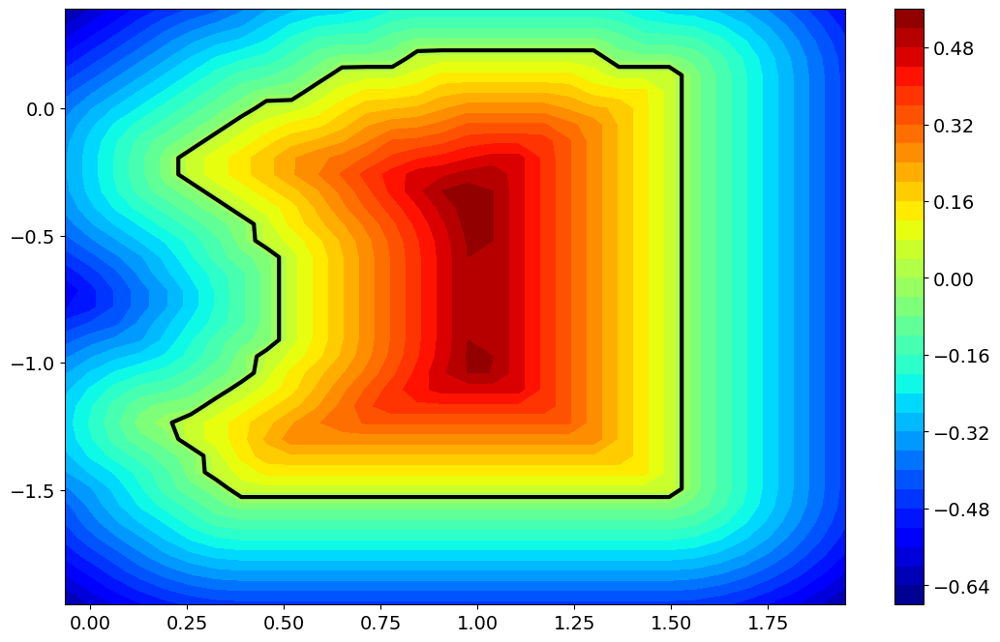

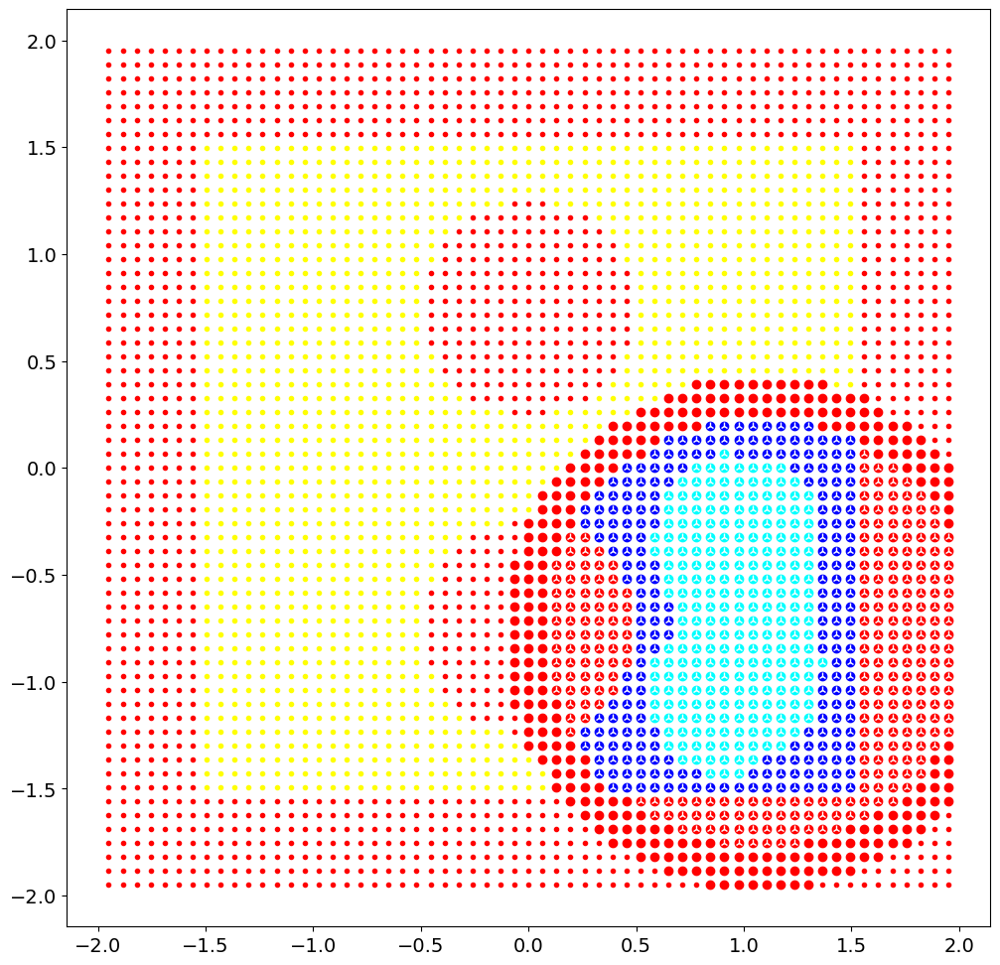

                                     CVXPY                                     
                                     v1.4.2                                    
(CVXPY) Jul 24 03:05:46 PM: Your problem has 474 variables, 1 constraints, and 0 parameters.
(CVXPY) Jul 24 03:05:46 PM: It is compliant with the following grammars: DCP, DQCP
(CVXPY) Jul 24 03:05:46 PM: (If you need to solve this problem multiple times, but with different data, consider using parameters.)
(CVXPY) Jul 24 03:05:46 PM: CVXPY will first compile your problem; then, it will invoke a numerical solver to obtain a solution.
(CVXPY) Jul 24 03:05:46 PM: Your problem is compiled with the CPP canonicalization backend.
-------------------------------------------------------------------------------
                                  Compilation                                  
-------------------------------------------------------------------------------
(CVXPY) Jul 24 03:05:46 PM: Compiling problem (target solver=CLARABEL).

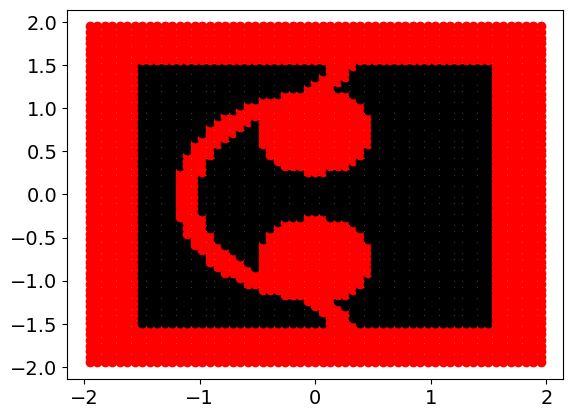

problem done building
centers shape before:
(749, 2)
(749, 2)
(749, 2)
(735, 2)
numc 735
cmax before 749
numc <= self.cmax
Cnew shape before (735, 2)
Cnew shape after (735, 2)
theta shape before (735,)
theta_shape after (749,)
cmax after 749
centers shape after
(749, 2)
(749, 2)
(749, 2)
(749, 2)
-------------------------------------------------------------
           Clarabel.rs v0.6.0  -  Clever Acronym              

                   (c) Paul Goulart                          
                University of Oxford, 2022                   
-------------------------------------------------------------

problem:
  variables     = 735
  constraints   = 1235
  nnz(P)        = 735
  nnz(A)        = 335363
  cones (total) = 1
    : Nonnegative = 1,  numel = 1235

settings:
  linear algebra: direct / qdldl, precision: 64 bit
  max iter = 200, time limit = Inf,  max step = 0.990
  tol_feas = 1.0e-8, tol_gap_abs = 1.0e-8, tol_gap_rel = 1.0e-8,
  static reg : on, ϵ1 = 1.0e-8, ϵ2 = 4.9e-32
  dy

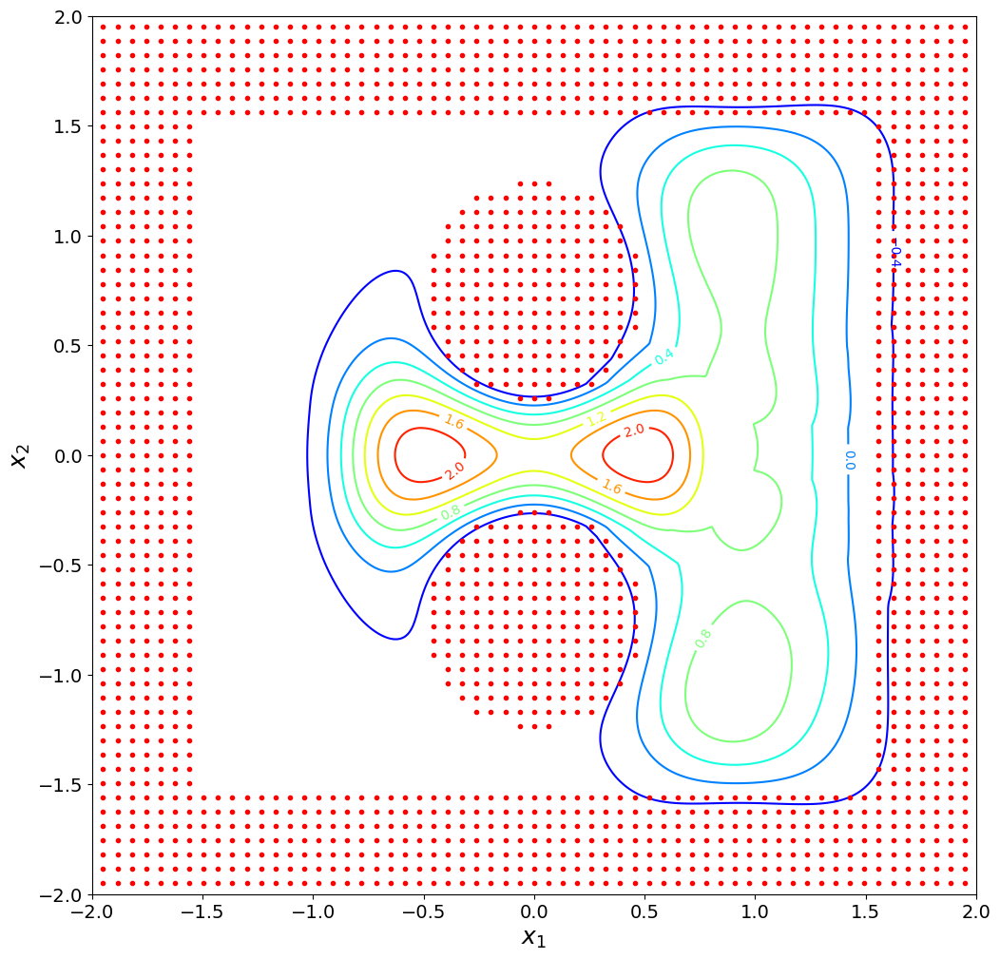

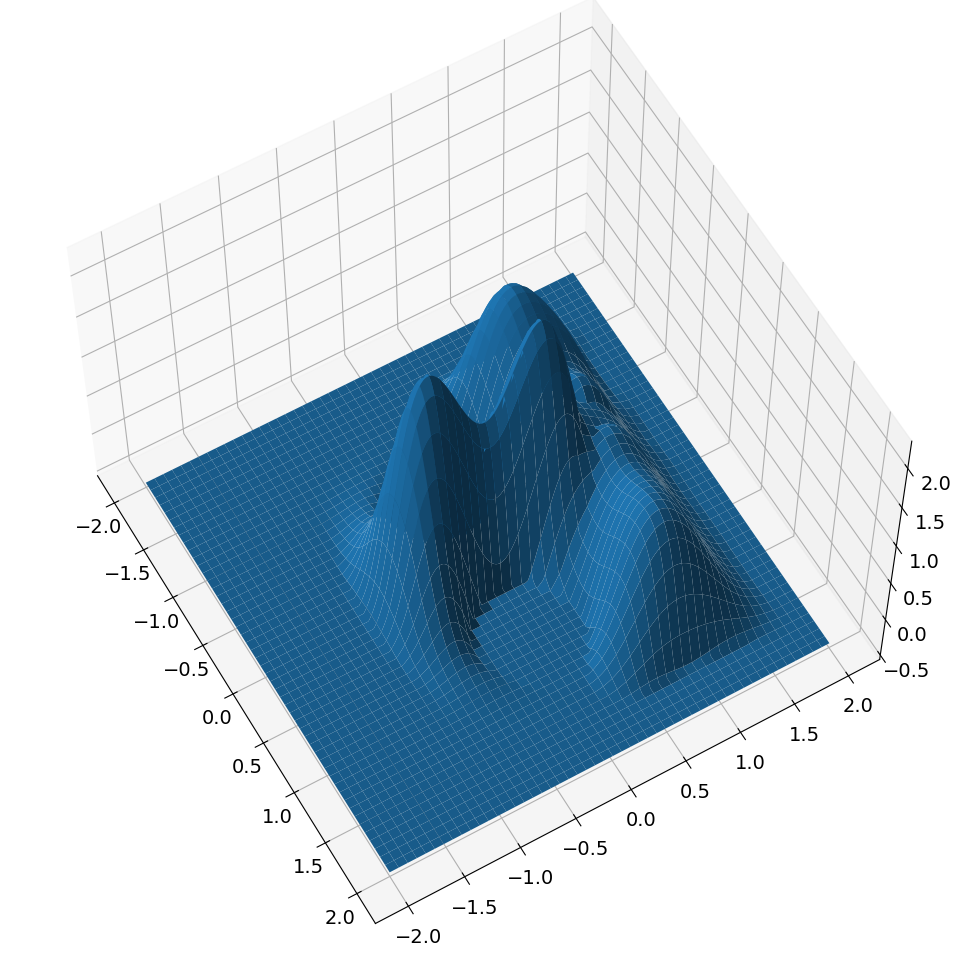

max h 2.279756011823026


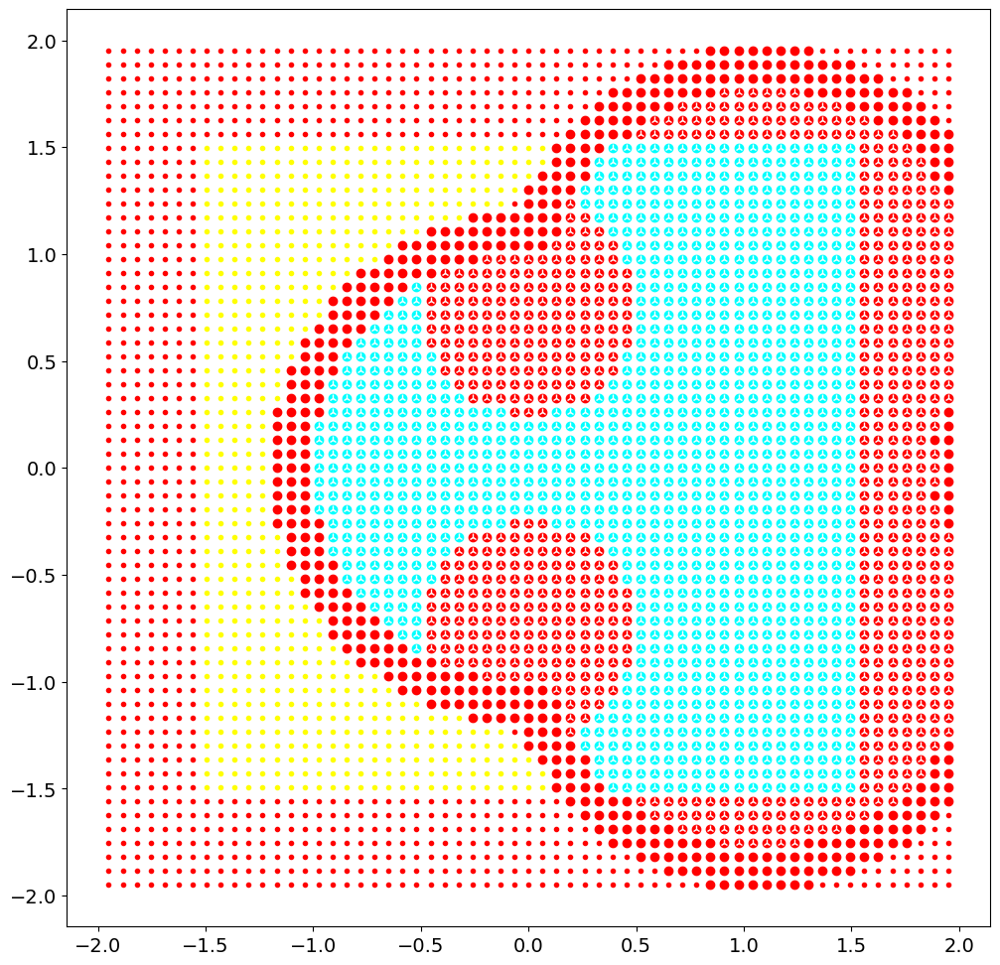

In [18]:
########################
### Safe Exploration ###
########################

targets   = [np.array([ 1.1,  0]),
             np.array([ 1.1,  1]),
             np.array([ 1.1, -1]),
             np.array([-1.1,  0])]
#targets   = None

for i in range(N):
    ######################
    ### Go to boundary ###
    ######################
    
    prev_pos = a.pos  
    if targets is not None:
        print("target:", targets[i]) 
        traj,usig = a.goto(targets[i], T=T, tend=tend, tol=tol, manual=True, DT=DT, eps=eps)  
        print("dx:", np.linalg.norm(a.pos - prev_pos))
    else: 
        while np.linalg.norm(a.pos - prev_pos) <= dx:    
            target = a.width*(1+unsafe_margin)*(np.random.rand(2)-0.5)  
            while h(target, np.array(a.centers), np.array(a.thetas))[0] > 0:
                target = a.width*(1+unsafe_margin)*(np.random.rand(2)-0.5)
            print("target:", target) 
            traj,usig=a.goto(target, T=T, tend=tend, tol=tol, manual=True, DT=DT, eps=eps) 
            print("dx:", np.linalg.norm(a.pos - prev_pos))

    ####################
    ### Collect data ###
    ####################

    # scan states 
    pts_safe, pts_unsafe, in_scan_f = a.scan(ret_in_scan_f=True)
    scan_funcs.append(in_scan_f)
    samples, gparams,\
             is_obs_sample = a.sample(rx, grid=s_grid, hjb_grid=hjb_grid, hjb=True)
    sample_funcs.append(is_obs_sample)
    loc_V, loc_hjb_grid    = a.get_local_V(gparams, obs_funcs + [is_obs_sample], rx=rx, T=100, mult=mult)
    scan_safe, scan_unsafe = a.scan_hjb(loc_V, loc_hjb_grid)
    n_safe                 = len(pts_safe)
    x_buffer, x_safe       = a.make_buffer(scan_safe, int(nm * n_safe), p)
    
    # unsafe states 
    if scan_unsafe.shape[0] != 0:
        x_unsafe = np.vstack((scan_unsafe, samples))
    else: 
        x_unsafe = samples    
        
    # centers
    C = []
    for x in c_grid:
        if np.linalg.norm(x - a.pos) <= rc:
            C.append(x)
    C = np.array(C)    
    a.centers.append(C)

    # plot CBF data
    plot_data(grid, obs_dict, [(x_safe  , "cyan"  , 'o'), 
                               (x_buffer, "blue"  , 'o'), 
                               (x_unsafe, "red"   , 'o'),
                               (C       , "white" , '2')])

    # safe and buffer control
    u_safe = hjb_controls_parallel(a, x_safe, loc_hjb_grid, loc_V, verbose=True)
    if x_buffer.shape[0] != 0:
        u_buffer = hjb_controls_parallel(a, x_buffer, loc_hjb_grid, loc_V)
    else:
        u_buffer = np.array([])

    # total data 
    from data import check_obs
    all_obs_func = lambda x: check_obs(x, obs_funcs) or (check_obs(x, sample_funcs) and not check_obs(x, scan_funcs))
    out_func     = lambda x: not ( check_obs(x, all_obs_func) or check_obs(x, scan_funcs) )
    obsamp_f     = lambda x: (check_obs(x, sample_funcs) or check_obs(x, obs_funcs)) and not (check_obs(x, scan_funcs) and not check_obs(x, obs_funcs))
    for x in grid:
        if obsamp_f(x):
            plt.plot(x[0], x[1], color='red', marker='o', linestyle='none')           
        else:
            plt.plot(x[0], x[1], color='black', marker='o', linestyle='none')
    plt.show()
 
    #####################
    ### Learn new CBF ###
    ##################### 
    #L = get_learning_cbfs_lagrangian_hj(a, x_safe, u_safe, x_buffer, u_buffer, x_unsafe, lam_safe, lam_dyn, lam_unsafe, lam_dh, gamma_safe, gamma_dyn, gamma_unsafe)
    #theta, _, _ = scipy.optimize.fmin_l_bfgs_b(L, 10*(np.random.rand(C.shape[0], 1)-5), approx_grad=False, iprint=50) 
    
    theta = np.array(clarabel_solve_cbf(a, x_safe, u_safe, x_buffer, u_buffer, x_unsafe, gamma_safe, gamma_dyn, gamma_unsafe))
    a.thetas.append(theta)
    a.rectify_c_and_theta()

    # plot new CBF
    h_max = plot_cbf(a, np.array(a.centers), np.array(a.thetas), obstacles=obstacles)

    # collect quad plot data
    curr_data    = np.copy(np.vstack( ( curr_data, np.vstack((x_safe, x_buffer, x_unsafe)) ) ))
    curr_centers = np.copy(np.array(a.centers))
    curr_thetas  = np.copy(np.array(a.thetas))
    curr_traj    = np.copy(np.vstack( (curr_traj, traj) ))
    quad_plot_args[-1] = quad_plot_args[-1] + (curr_traj,)
    quad_plot_args.append((i+1, curr_centers, curr_thetas, curr_data))

    data_safe   = union(data_safe, np.vstack((x_buffer, x_safe)))
    data_unsafe = difference(union(data_unsafe, x_unsafe), data_safe)
    all_C = union(all_C, C)
    
    plot_data(grid, obs_dict, [(data_safe  , "cyan"  , 'o'), 
                               (data_unsafe, "red"   , 'o'),
                               (all_C      , "white" , '2')])
    #plot_angle_data(all_C, grid, obs_dict, spacing, safe=data_safe, unsafe=data_unsafe, title="ALL DATA")

final_pos = np.copy(a.pos)
quad_plot_args[-1] = quad_plot_args[-1] + (curr_traj,)

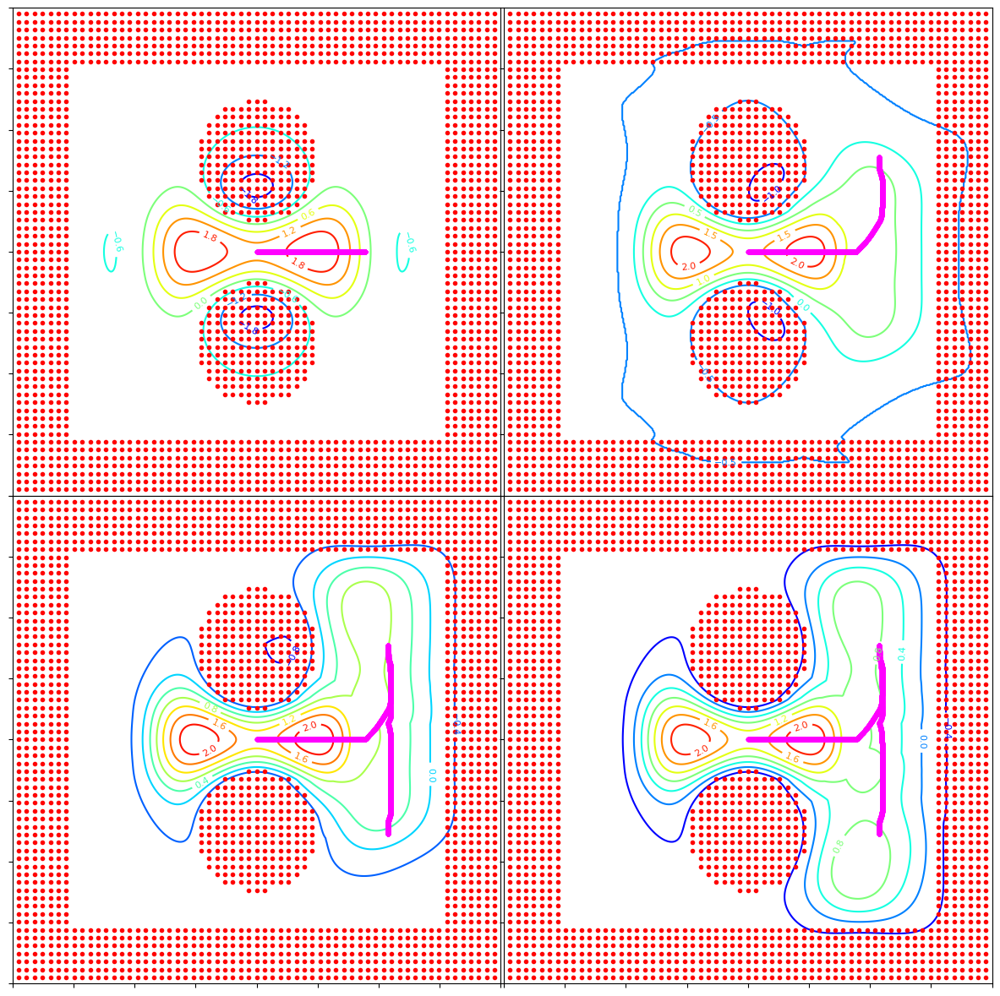

In [19]:
#######################################
### Sequential plot of learned CBFs ###
#######################################

fig = plt.figure(figsize=(15, 15))
axs = [fig.add_subplot(2,2,i+1) for i in range(4)]

for ax in axs:
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.set_aspect('equal') 
    
fig.subplots_adjust(wspace=0, hspace=0)

for i, args in enumerate(quad_plot_args):
    quad_plot(a, axs[i], args[0], args[1], args[2], args[3], args[4], grid, obs_dict, obstacles=obstacles)
plt.show()

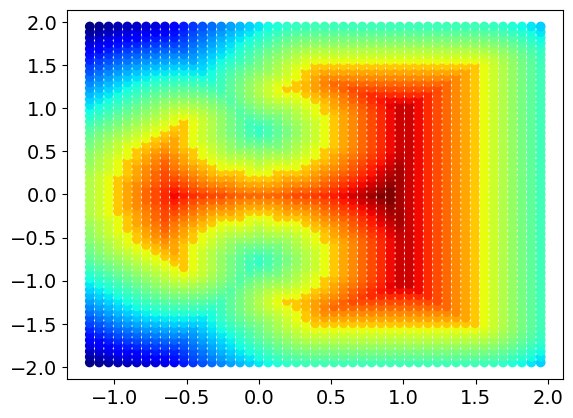

100%|#############################################################################################################################################| 100.0000/100.0 [00:07<00:00, 13.45sim_s/s]


number of gridpoints: (5978,)
                                     CVXPY                                     
                                     v1.4.2                                    
(CVXPY) Jul 24 03:07:59 PM: Your problem has 1108 variables, 1 constraints, and 0 parameters.
(CVXPY) Jul 24 03:07:59 PM: It is compliant with the following grammars: DCP, DQCP
(CVXPY) Jul 24 03:07:59 PM: (If you need to solve this problem multiple times, but with different data, consider using parameters.)
(CVXPY) Jul 24 03:07:59 PM: CVXPY will first compile your problem; then, it will invoke a numerical solver to obtain a solution.
(CVXPY) Jul 24 03:07:59 PM: Your problem is compiled with the CPP canonicalization backend.
-------------------------------------------------------------------------------
                                  Compilation                                  
-------------------------------------------------------------------------------
(CVXPY) Jul 24 03:07:59 PM: Compiling pr

<Figure size 640x480 with 0 Axes>

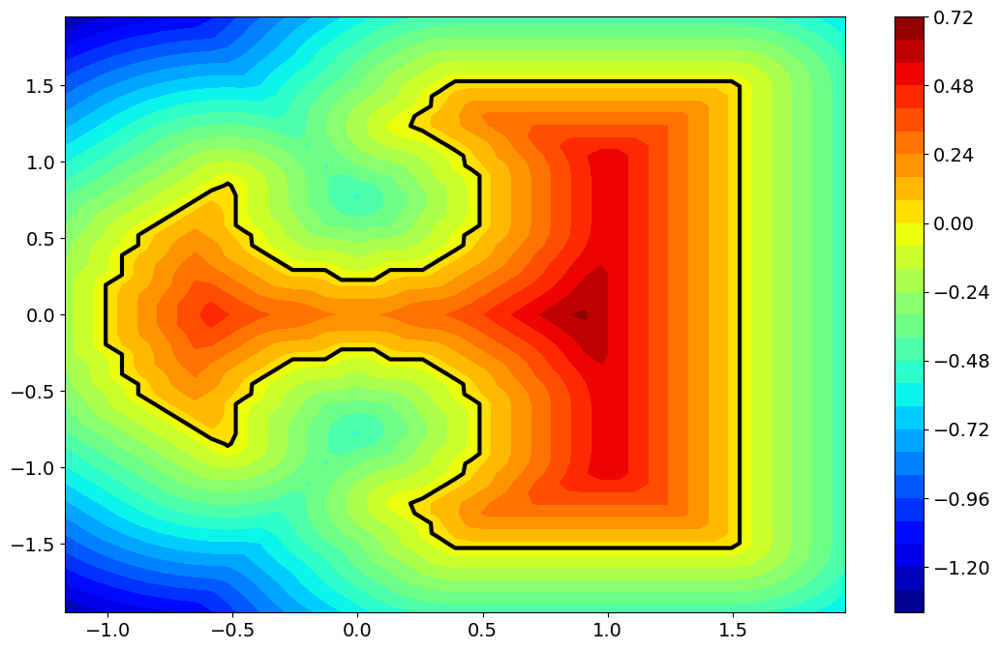

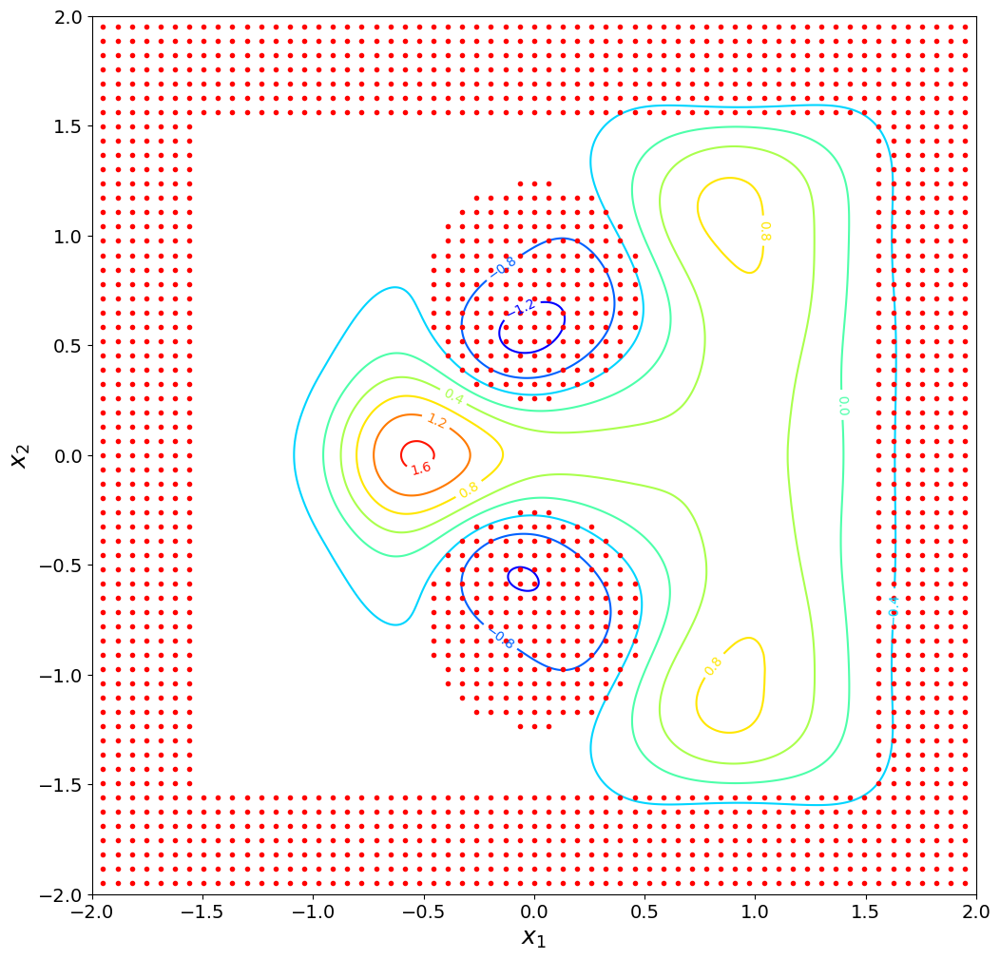

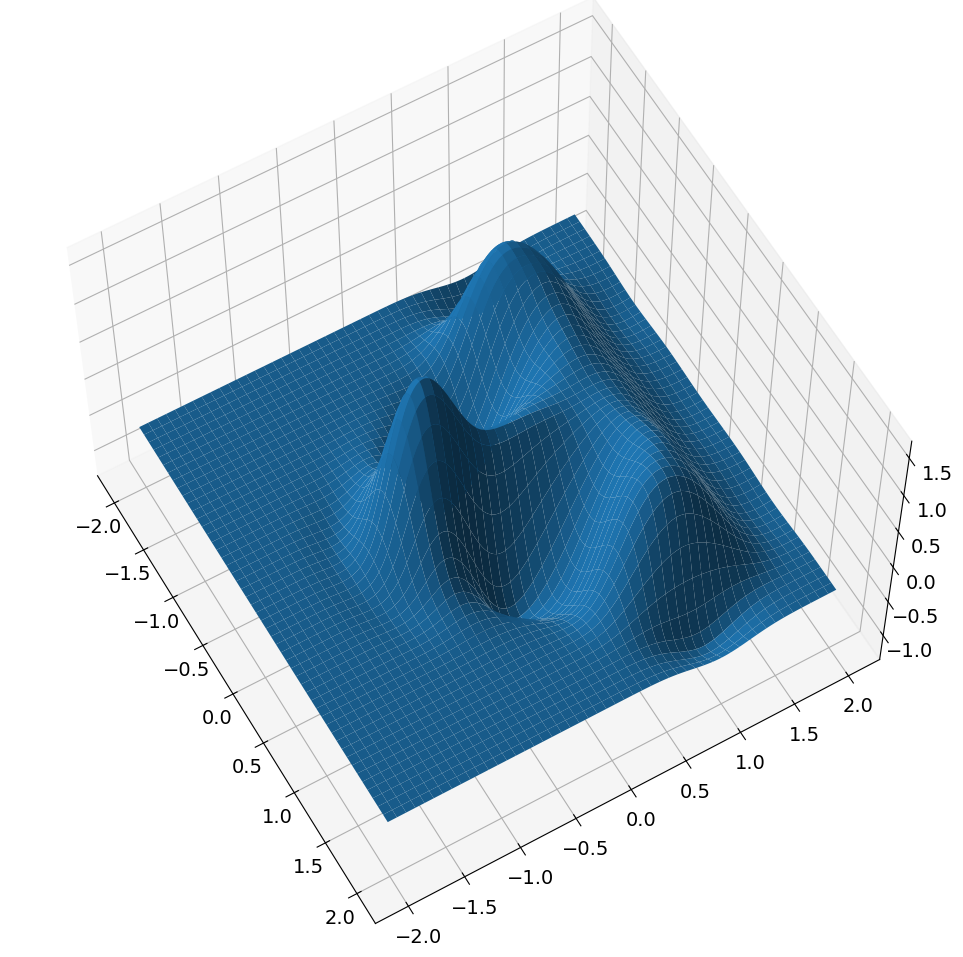

max h 1.6615891293465301


In [20]:
##################################################
### Learn a single CBF from all data collected ###
##################################################

n_safe = len(pts_safe)
all_obs_func = lambda x: (check_obs(x, sample_funcs) or check_obs(x, obs_funcs)) and not (check_obs(x, scan_funcs) and not check_obs(x, obs_funcs))
out_func     = lambda x: not ( check_obs(x, all_obs_func) or check_obs(x, scan_funcs) )
gparams = get_gparams(np.vstack((data_safe, data_unsafe)), hjb_grid)
loc_V, loc_hjb_grid = a.get_local_V(gparams, all_obs_func, rx=None, out_func=out_func, T=100, mult=mult)
print("number of gridpoints:", loc_hjb_grid.states.flatten().shape)
all_x_buffer, all_x_safe = a.make_buffer(data_safe, int(nm * n_safe), p) 
all_u_safe = hjb_controls_parallel(a, all_x_safe, loc_hjb_grid, loc_V, verbose=True)
if x_buffer.shape[0] != 0:
    all_u_buffer = hjb_controls_parallel(a, all_x_buffer, loc_hjb_grid, loc_V)
else:
    all_u_buffer = np.array([])
all_theta = np.array(clarabel_solve_cbf(a, all_x_safe, all_u_safe, all_x_buffer, all_u_buffer, data_unsafe, gamma_safe, gamma_dyn, gamma_unsafe, centers=all_C))
h_max = plot_cbf(a, np.array(all_C)[np.newaxis,...], np.array(all_theta)[np.newaxis,...], obstacles=obstacles)

position is [-0.5  0. ]
h is 2.2779089849666234
start time is 140


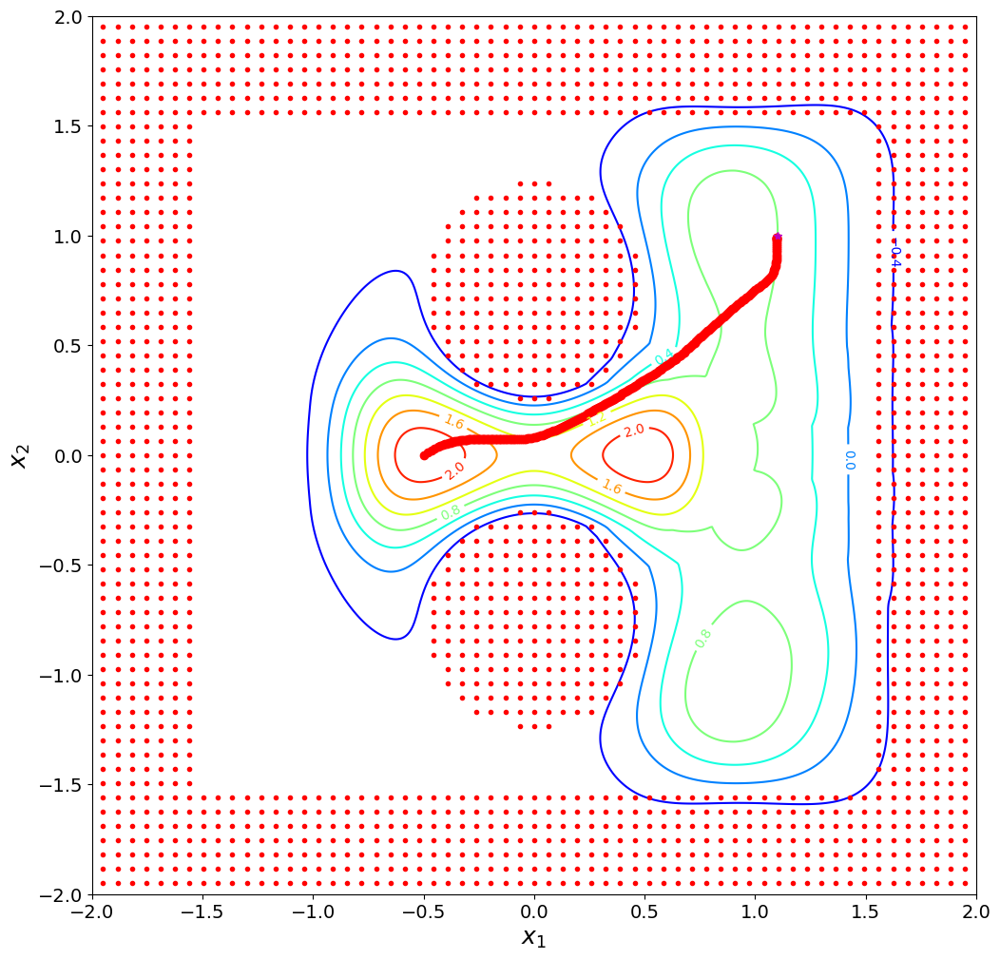

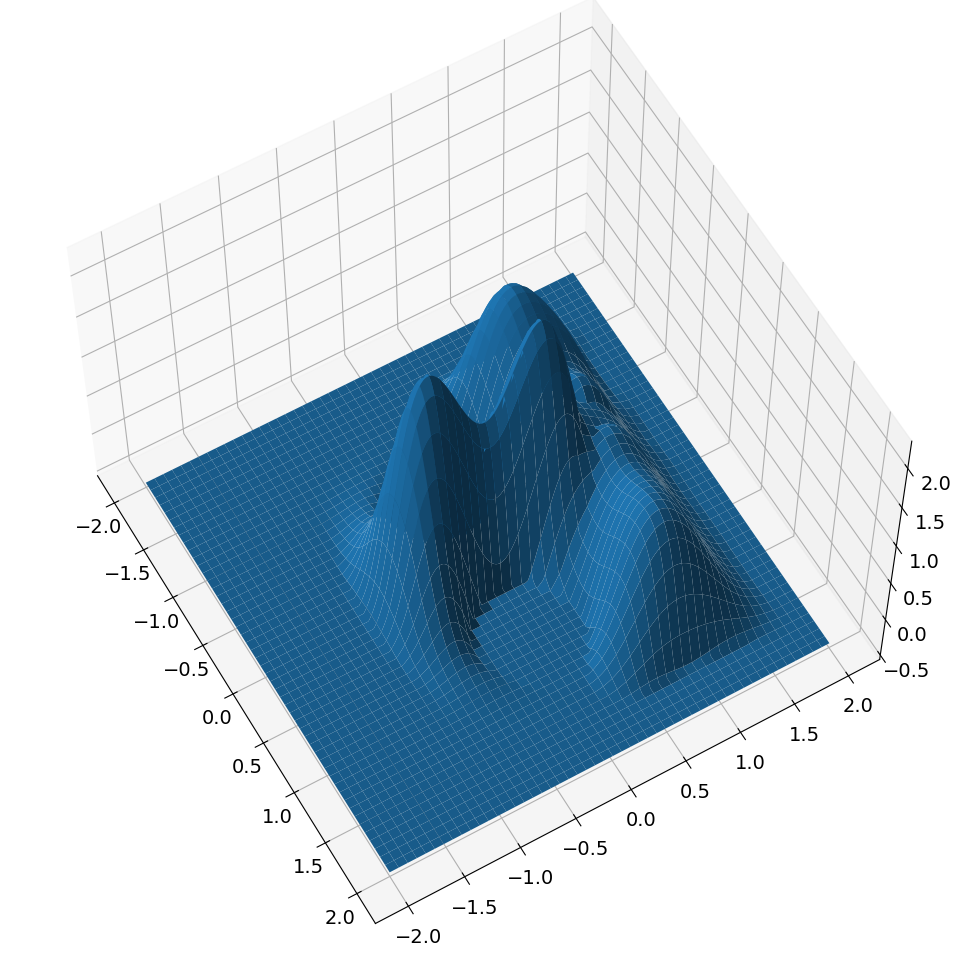

max h 2.279756011823026
new position is [1.0998497  0.99194479]
h is now 0.8049164386444998
new time is 160
position is [-0.5  0. ]
h is 1.6518179403233688
start time is 140


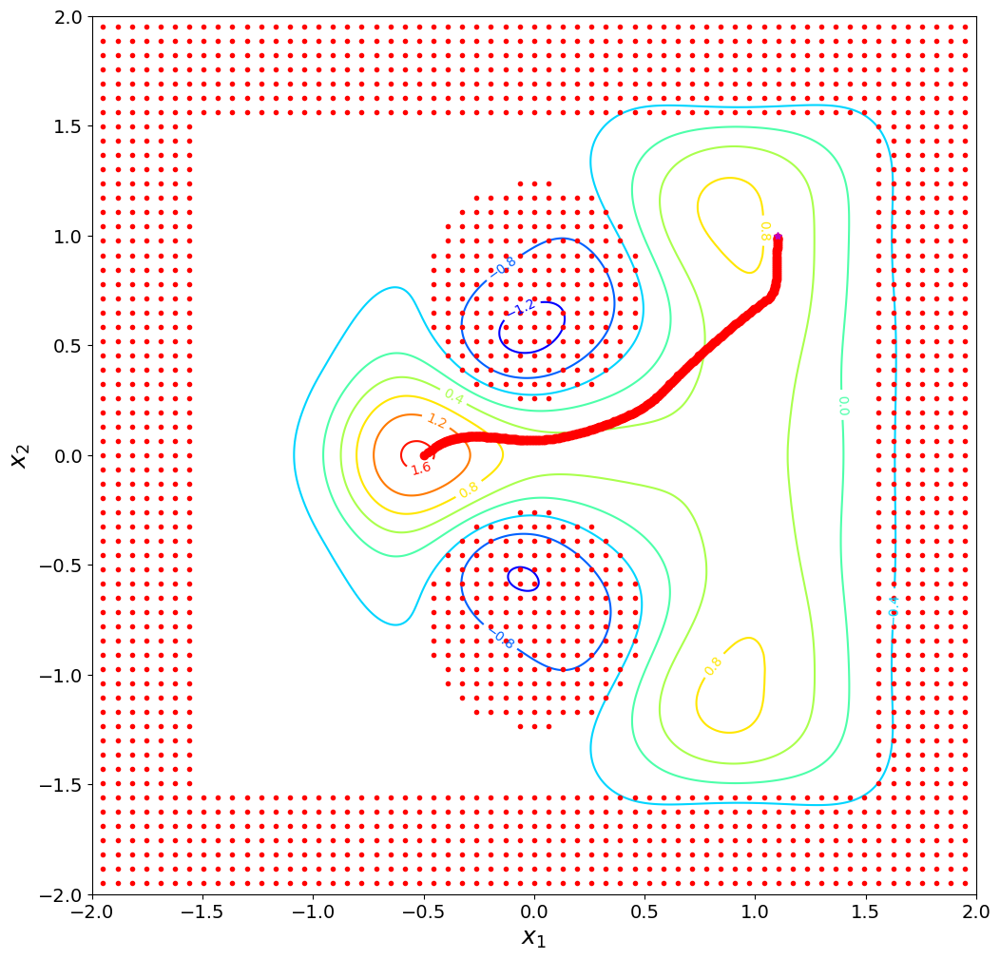

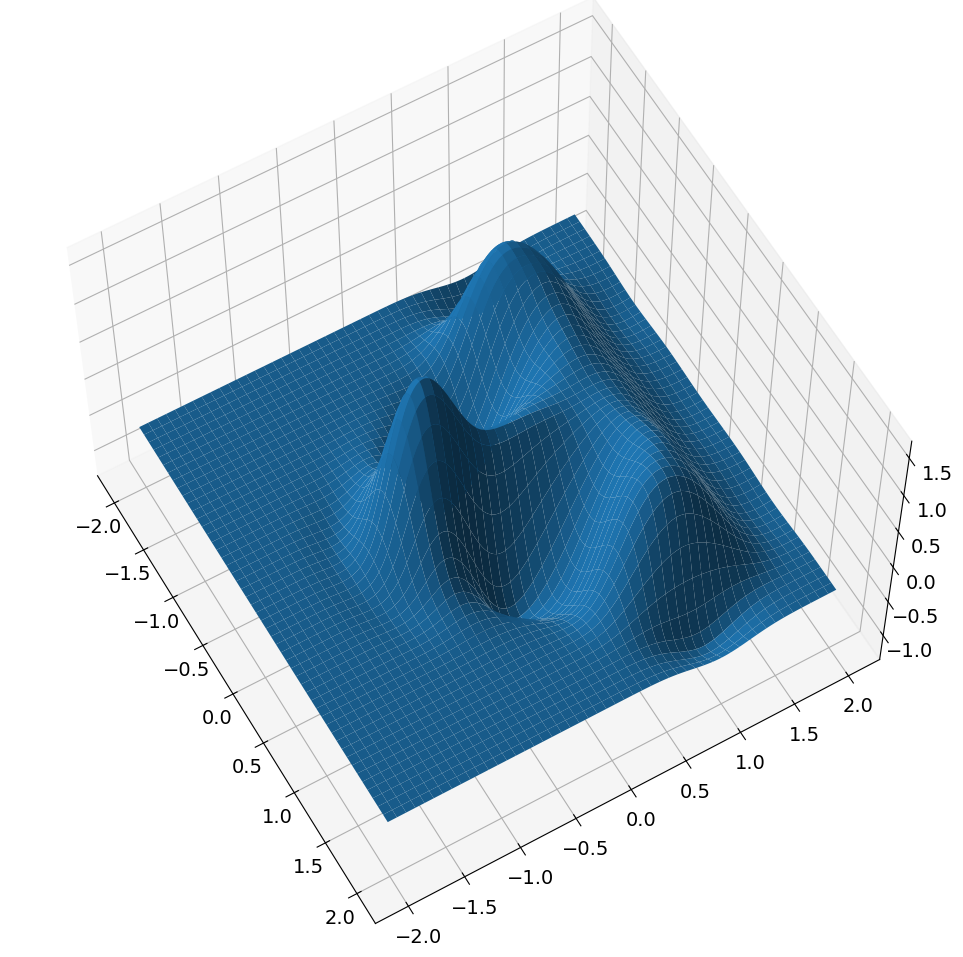

max h 1.6615891293465301
new position is [1.09998298 0.99001902]
h is now 0.7282212109630386
new time is 160


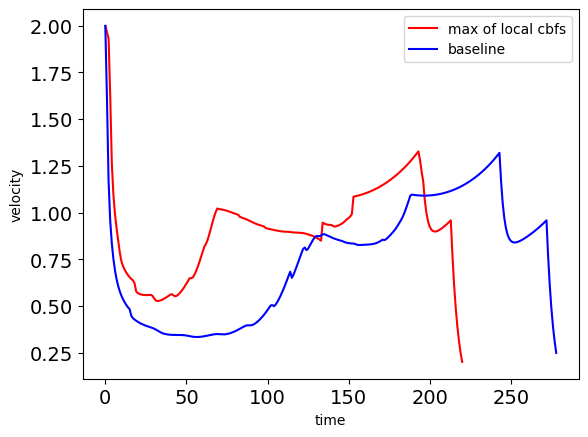

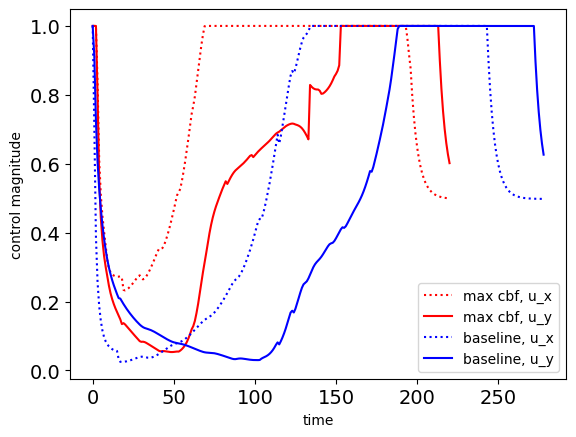

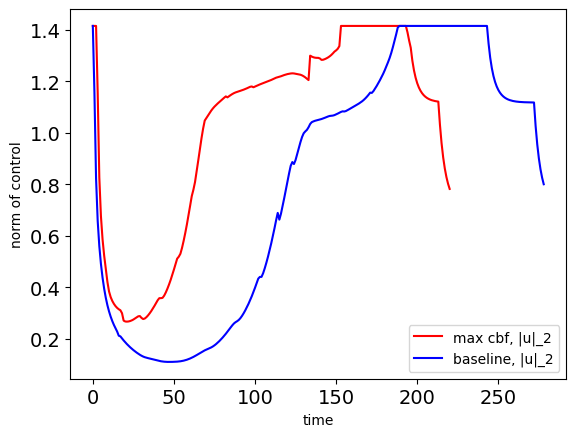

In [25]:
#############################
### Plot velocity curves ####
#############################
import copy

a2 = copy.copy(a)
a2.thetas = [all_theta]
a2.centers= [all_C]

start_pos = np.array([-0.5, 0])
target    = np.array([ 1.1, 1])
a.pos = start_pos
a2.pos= start_pos

DT   = 0.01
tol  = 0.1
traj ,usig = a.goto(target, T=T, tend=tend, tol=tol, manual=True, DT=DT, eps=eps)  
traj2,usig2= a2.goto(target, T=T, tend=tend, tol=tol, manual=True, DT=DT, eps=eps)  

v1 = np.linalg.norm(np.vstack((traj[1:],np.array([0,0])))  - traj, axis=1)/DT
v2 = np.linalg.norm(np.vstack((traj2[1:],np.array([0,0])))  - traj2, axis=1)/DT
plt.plot(v1[:-1], color="red", label="max of local cbfs")
plt.plot(v2[:-1], color="blue", label="baseline")
plt.ylabel("velocity")
plt.xlabel("time")
plt.legend()
plt.show()

plt.plot(usig[:,0], color="red", linestyle='dotted', label="max cbf, u_x")
plt.plot(usig[:,1], color="red", label="max cbf, u_y")
plt.plot(usig2[:,0], color="blue", linestyle='dotted', label="baseline, u_x")
plt.plot(usig2[:,1], color="blue", label="baseline, u_y")
plt.ylabel("control magnitude")
plt.xlabel("time")
plt.legend()
plt.show()

plt.plot(np.linalg.norm(usig, axis=1), color="red", label="max cbf, |u|_2")
plt.plot(np.linalg.norm(usig2, axis=1), color="blue", label="baseline, |u|_2")
plt.ylabel("norm of control")
plt.xlabel("time")
plt.legend()
plt.show()